In [1]:
# Install required Python packages
# You can uncomment and run these lines if you haven't installed them yet.
# !pip install scanpy squidpy anndata pandas matplotlib seaborn scikit-learn

# Import necessary libraries
import scanpy as sc
import squidpy as sq
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.mixture import GaussianMixture

# For visualization
import matplotlib.patches as mpatches


C:\Users\abuhu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\dask\dataframe\__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
C:\Users\abuhu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\anndata\utils.py:434: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


In [2]:
# Load 10X Genomics Visium spatial transcriptomics data
#adata = sq.datasets.visium_fluo("knee")  # if you have your own data path, use `sq.read.visium`

# Alternatively, load your local data (matches R code path)
adata = sq.read.visium(path="knee_spatial_python/knee", load_images=True)

# Basic overview
print(adata)


C:\Users\abuhu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
C:\Users\abuhu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 2072 × 32285
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'


C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\1695148888.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color=None, title="All Spots")


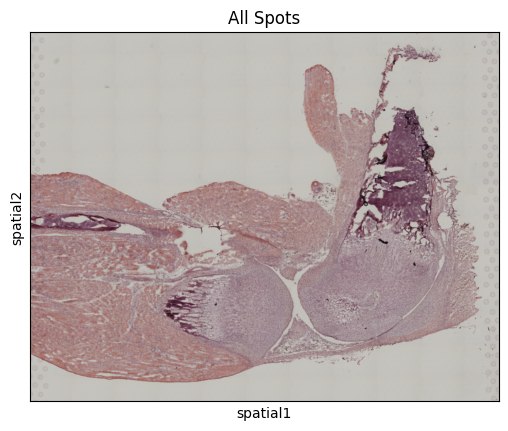

In [3]:
# Plot the tissue section with spatial spots
sc.pl.spatial(adata, img_key="hires", color=None, title="All Spots")


In [4]:
# Load expert annotations
annotations = pd.read_csv("knee_spatial_python/knee/GP_features_1_Slide_1_A_WTM_Results_GP_ann.csv")

# Clean and standardize labels
annotations["GP"] = annotations["GP"].replace({
    "chondrocytes": "chondrocyte",
    "pre-osteo": "pre-osteoblast",
    "pre-osteoblasr": "pre-osteoblast",
    "secondary hypertophic": "secondary hypertrophic"
})

# Add the cleaned annotation to the AnnData object metadata
adata.obs["Expert_Annotation"] = annotations["GP"].values


C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\2628280721.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


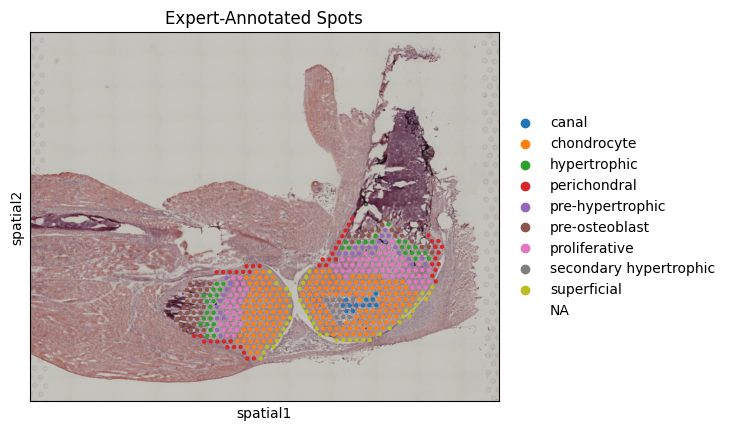

In [5]:
# Plot spatial expression colored by expert annotation
sc.pl.spatial(
    adata,
    img_key="hires",
    color="Expert_Annotation",
    size=1.0,
    title="Expert-Annotated Spots"
)


C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\2912577174.py:5: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


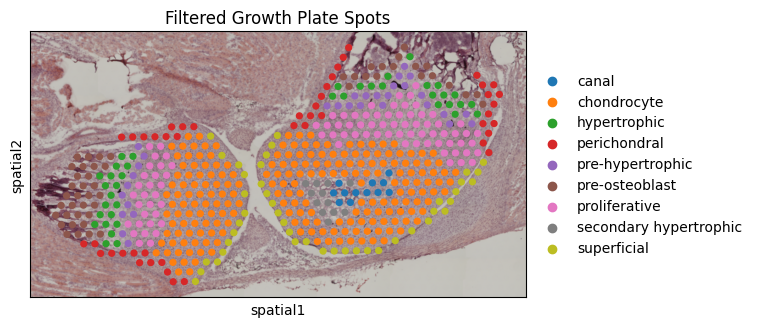

In [6]:
# Filter out spots with no expert annotation
adata = adata[adata.obs["Expert_Annotation"].notna() & (adata.obs["Expert_Annotation"] != ""), :]

# Plot again to confirm
sc.pl.spatial(
    adata,
    img_key="hires",
    color="Expert_Annotation",
    size=1.0,
    title="Filtered Growth Plate Spots"
)


In [7]:
adata.var_names[adata.var_names.duplicated()].unique()


Index(['Ptp4a1', 'Arhgef4', 'Sept2', 'Zc3h11a', 'Gm16701', 'Pakap', 'Gm28710',
       'Jakmip1', 'Fam220a', 'Gm16499', 'Olfr290', 'Aldoa', 'Dpep2', 'Gm16364',
       'C730027H18Rik', 'Ddit3', 'St6galnac2', 'Gm35558', 'Ighv5-8',
       'Ighv1-13', 'Nnt', 'Gm5089', '4930594M22Rik', 'Gm41392', 'Gm38619',
       'Snhg4', 'Pcdha11', 'Gm35438', 'Btbd35f1', 'Fam90a1b', 'Ccl21b',
       'Fam205a4', 'Gm3286', 'Il11ra2', 'Ccl27a', 'Ccl21c', 'Ccl19', 'Ccl21a'],
      dtype='object')

C:\Users\abuhu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


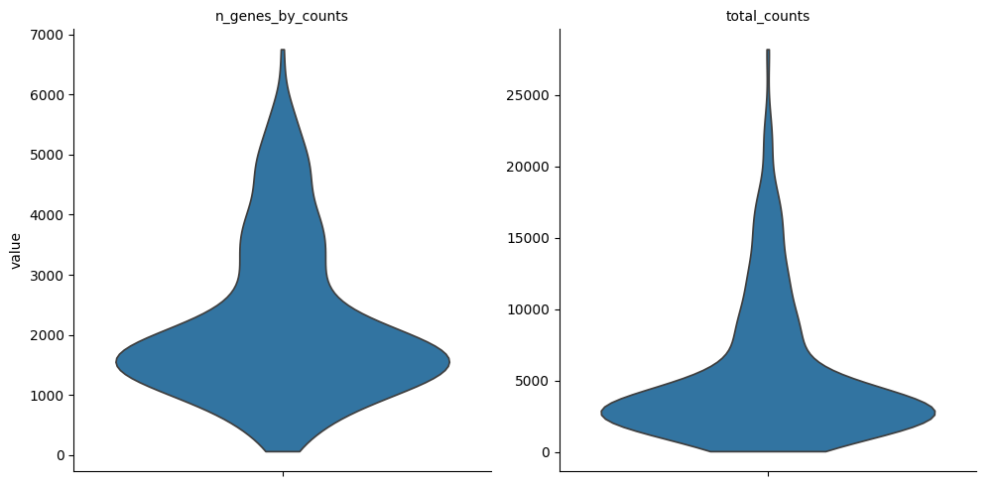

In [8]:
import scanpy as sc
import matplotlib.pyplot as plt

# Ensure unique gene names (needed to prevent errors in Scanpy)
adata.var_names_make_unique()

# Compute QC metrics if not already present
sc.pp.calculate_qc_metrics(adata, inplace=True)

# Plot violin plots for n_genes and total_counts per spot
sc.pl.violin(
    adata,
    keys=["n_genes_by_counts", "total_counts"],
    jitter=0.4,
    multi_panel=True,
    rotation=45,
    stripplot=False,
    show=True
)


### Interpretation:

- Most spots should show ~1500–4000 genes and ~2000–10000 total counts.
- Outliers with very low or very high values may represent poor-quality data (e.g., dead cells, empty spots, or ambient RNA contamination).
- This visualization will help define thresholds for filtering low-quality spots.


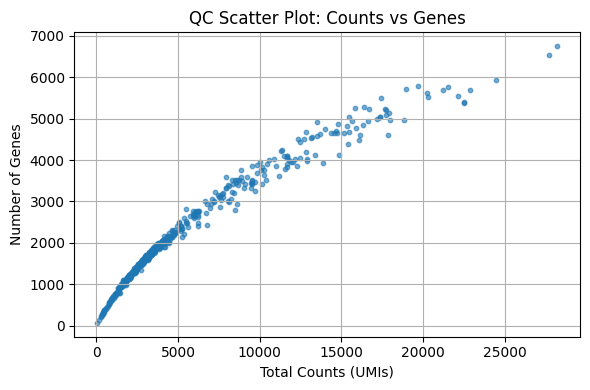

In [9]:
import scanpy as sc
import matplotlib.pyplot as plt

# Ensure gene names are unique
adata.var_names_make_unique()

# Calculate QC metrics if not already done
sc.pp.calculate_qc_metrics(adata, inplace=True)

# Plot scatter using matplotlib directly, as Scanpy doesn't support arbitrary x/y obs keys
plt.figure(figsize=(6, 4))
plt.scatter(
    adata.obs['total_counts'],
    adata.obs['n_genes_by_counts'],
    s=10,
    alpha=0.6
)
plt.xlabel('Total Counts (UMIs)')
plt.ylabel('Number of Genes')
plt.title('QC Scatter Plot: Counts vs Genes')
plt.grid(True)
plt.tight_layout()
plt.show()


In [10]:
import numpy as np

r = np.corrcoef(
    adata.obs['total_counts'],
    adata.obs['n_genes_by_counts']
)[0, 1]
print(f"Pearson correlation: r = {r:.2f}")


Pearson correlation: r = 0.97


### Interpretation:

- A strong positive correlation (e.g., r ≈ 0.97) is expected.
- Most spots follow this trend — higher RNA content leads to more gene diversity.
- Outlier points that deviate may represent technical artifacts or low-quality spots.


In [11]:
# Step-by-step SCTransform-like normalization
adata.var_names_make_unique()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata  # Save raw log-normalized data

# Filter out non-finite genes before HVG detection
valid_genes = np.isfinite(adata.X.mean(axis=0)).A1 if hasattr(adata.X, 'A1') else np.isfinite(adata.X.mean(axis=0))
adata = adata[:, valid_genes]

# Detect highly variable genes (Scanpy’s Seurat-like method)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

# Optional: restrict downstream analysis to HVGs only
adata = adata[:, adata.var.highly_variable]


C:\Users\abuhu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\scanpy\preprocessing\_highly_variable_genes.py:703: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}


### SCTransform Equivalent in Scanpy

- Normalization to 10,000 counts per spot standardizes for sequencing depth.
- Log1p transformation stabilizes variance, similar to Seurat’s SCTransform.
- Highly variable gene selection ensures dimensionality reduction uses informative features.


C:\Users\abuhu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\scanpy\preprocessing\_pca\__init__.py:383: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


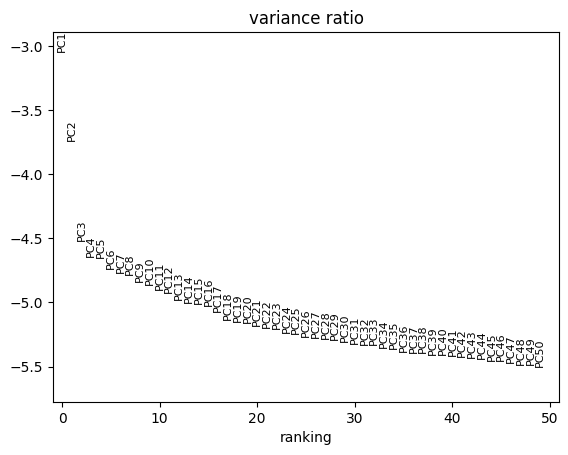

C:\Users\abuhu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


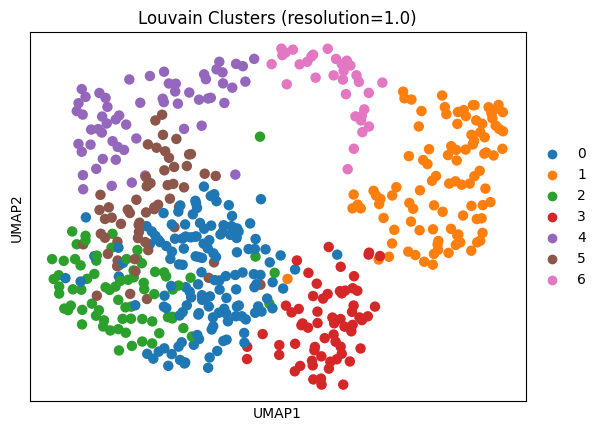

In [12]:
import scanpy as sc

# PCA on log-normalized, HVG-filtered data
sc.tl.pca(adata, svd_solver='arpack')

# Plot PCA variance ratio (scree plot) — optional but useful
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)

# Build nearest neighbor graph (like Seurat's FindNeighbors)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30)

# Louvain clustering (like Seurat's FindClusters)
sc.tl.louvain(adata, resolution=1.0)

# UMAP for visualization (like RunUMAP)
sc.tl.umap(adata)

# Plot UMAP colored by Louvain clusters
sc.pl.umap(adata, color='louvain', title="Louvain Clusters (resolution=1.0)")


C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\2155150150.py:9: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


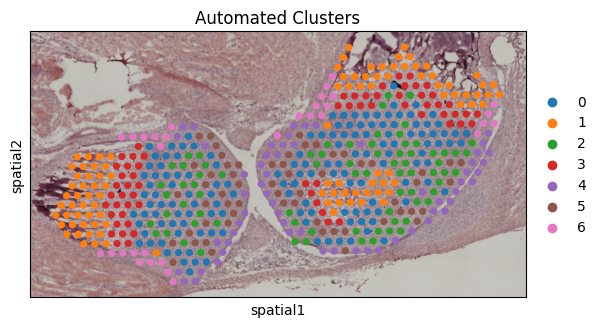

In [13]:
import squidpy as sq
import scanpy as sc
import matplotlib.pyplot as plt


# Spatial plot colored by clusters
# Equivalent to: SpatialDimPlot(group.by = "cluster")
# ---------------------------------------------
sc.pl.spatial(
    adata,
    img_key="hires",              # Use high-resolution tissue image
    color="louvain",              # Show cluster assignments
    title="Automated Clusters",
    size=1.0,                     # Adjust dot size as needed
    show=True
)


### Interpretation:

- This plot shows spatial transcriptomics clusters (0–4 or more) overlaid on the tissue image.
- These clusters were discovered based purely on gene expression — no expert annotation used.
- You can now compare these clusters with biological regions for validation.


In [14]:
import scanpy as sc
import pandas as pd

# Run differential expression test across all Expert_Annotation groups
# Equivalent to: FindAllMarkers(group.by = "Expert_Annotation")
sc.tl.rank_genes_groups(
    adata,
    groupby="Expert_Annotation",
    method="wilcoxon",        # Statistical method
    use_raw=True,             # Use normalized expression
    pts=True                  # Report fraction of cells expressing the gene
)


1. View top five marker genes

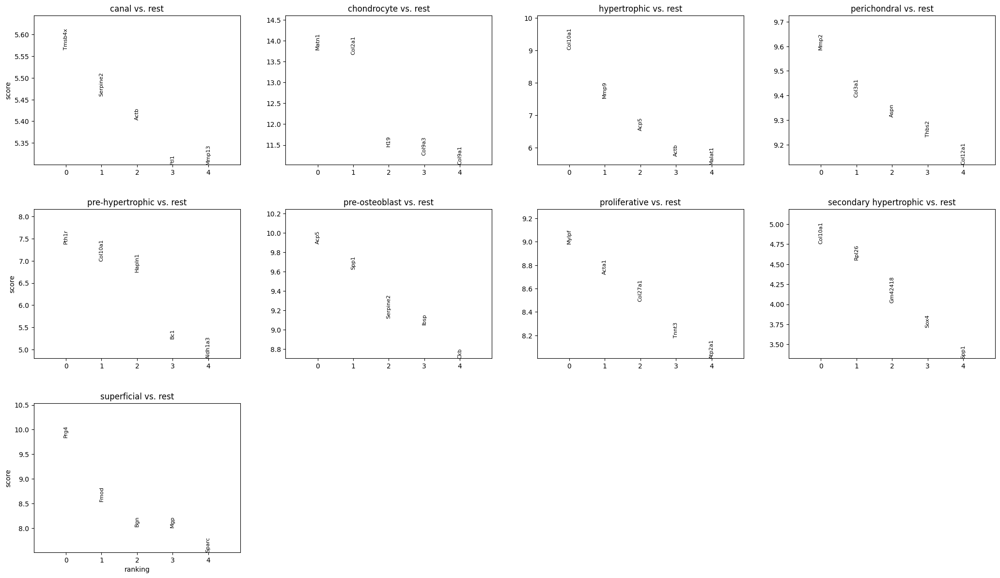

In [15]:
# View top genes per expert annotation
sc.pl.rank_genes_groups(adata, n_genes=5, sharey=False)


2. Export DEGs to CSV (for use in figures or reports)

In [16]:
degs = sc.get.rank_genes_groups_df(adata, group=None)  # All groups
degs['gene_base'] = degs['names'].str.replace(r'\.\d+$', '', regex=True)
degs.to_csv("Expert_Annotation_DEGs.csv", index=False)


3. Visualize top spatial markers

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\2616299861.py:5: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


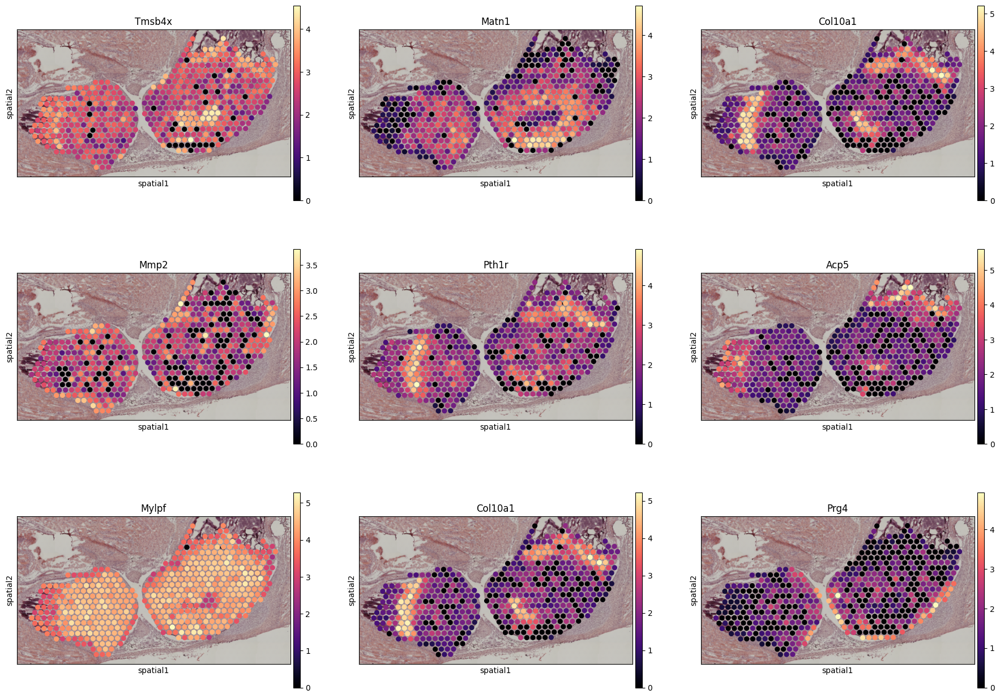

In [17]:
# Example: plot top marker for each expert annotation
top_genes = degs.groupby("group")["names"].first().tolist()

# Spatial expression plots
sc.pl.spatial(
    adata,
    color=top_genes,
    img_key="hires",
    ncols=3,
    size=1.3,
    cmap="magma"
)


4. (Optional) Compare DEGs with Louvain clusters

In [18]:
sc.tl.rank_genes_groups(adata, groupby="louvain", method="wilcoxon")


Plot marker genes:

Provided code focuses on specific biologically relevant genes related to our research question.

In [19]:
import scanpy as sc
import squidpy as sq
import pandas as pd

# ---------------------------------------------------------
# 1. Differential Expression for Louvain Clusters
# Equivalent to: FindAllMarkers(slide1)
# ---------------------------------------------------------
sc.tl.rank_genes_groups(
    adata,
    groupby="louvain",           # Automated clustering result
    method="wilcoxon",
    use_raw=True,
    pts=True
)

# Store results in a DataFrame
deg_all = sc.get.rank_genes_groups_df(adata, group=None)
deg_all['gene_base'] = deg_all['names'].str.replace(r'\.\d+$', '', regex=True)


C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\1807509152.py:10: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


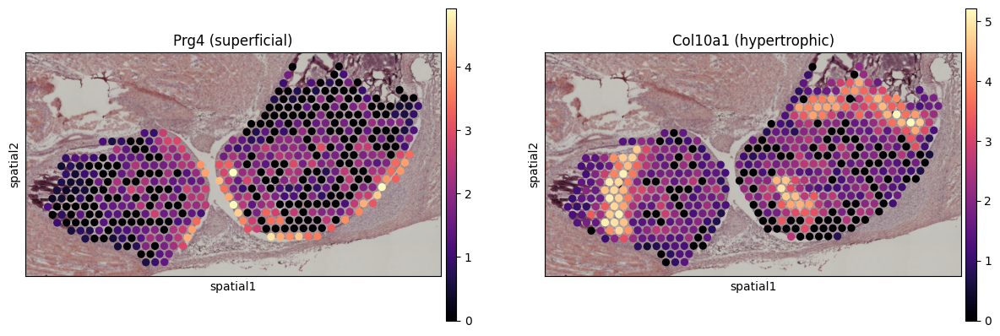

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\1807509152.py:21: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


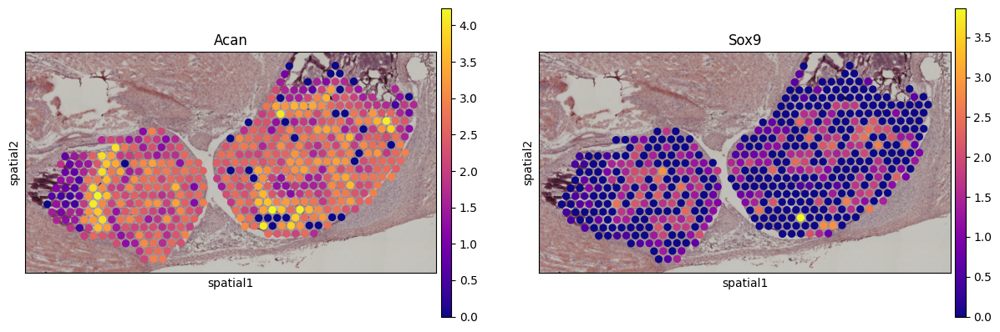

In [20]:
# Define genes of interest
genes_of_interest_Primary = ["Prg4", "Col10a1"]
genes_of_interest_Secondary = ["Acan", "Sox9"]

# ---------------------------------------------------------
# 2. Spatial Feature Plots (like SpatialFeaturePlot in R)
# ---------------------------------------------------------

# Plot primary markers
sc.pl.spatial(
    adata,
    color=genes_of_interest_Primary,
    img_key="hires",
    ncols=2,
    size=1.3,
    cmap="magma",
    title=["Prg4 (superficial)", "Col10a1 (hypertrophic)"]
)

# Plot secondary markers
sc.pl.spatial(
    adata,
    color=genes_of_interest_Secondary,
    img_key="hires",
    ncols=2,
    size=1.3,
    cmap="plasma",
    title=["Acan", "Sox9"]
)


### Interpretation of Spatial Markers

- **Prg4**:
  - Strongly expressed near tissue edges, marking superficial cartilage zones.
  - Key role in joint lubrication and surface homeostasis (Pawlak 2019, Matsushita 2017).
- **Col10a1**:
  - Localized to central/deep tissue zones.
  - Marker of hypertrophic chondrocytes in ossifying cartilage (Han 2024, Limpach 2006).
- **Acan** and **Sox9**:
  - Co-expressed in cartilage-forming regions.
  - Acan for extracellular matrix, Sox9 as a master chondrogenic transcription factor.


Compare the expert annotations to the clustering results:

Provided code compares automated clusters with expert annotations, a key requirement for your poster assignment.

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\2789487842.py:16: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


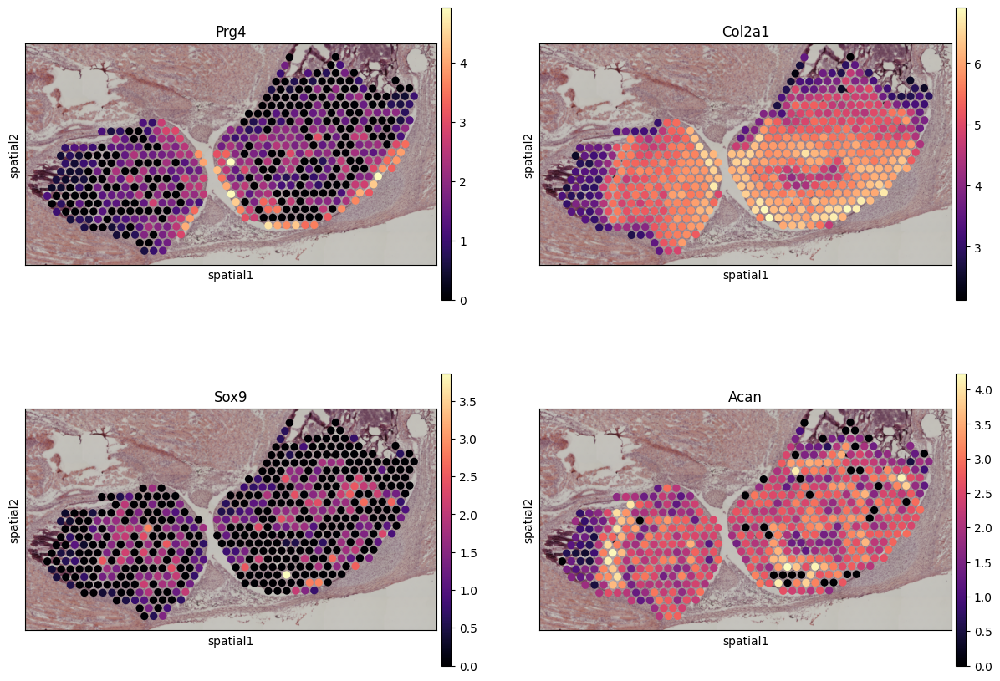

In [21]:
import scanpy as sc
import squidpy as sq
import pandas as pd

# ----------------------------------------------------
# Define genes based on prior biological knowledge
# ----------------------------------------------------
selected_genes = ["Prg4", "Col2a1", "Sox9", "Acan"]

# If we have DEG results and want to clean gene names:
degs['gene_base'] = degs['names'].str.replace(r'\.\d+$', '', regex=True)

# ----------------------------------------------------
# Spatial Feature Plots for Prior-Knowledge Genes
# ----------------------------------------------------
sc.pl.spatial(
    adata,
    color=selected_genes,
    img_key="hires",
    ncols=2,
    size=1.3,
    cmap="magma",
    title=selected_genes
)


### Spatial Expression of Biologically Relevant Genes

- **Prg4**: Marker for superficial cartilage zones.
- **Col2a1 & Acan**: Highlight cartilage extracellular matrix structure.
- **Sox9**: Key transcription factor regulating chondrocyte differentiation and maintaining cartilage identity (Han et al. 2024; Haseeb et al. 2021).

These spatial patterns reflect tissue specialization and align with known cartilage biology.


1. Adjust color scales per gene

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\3185300570.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


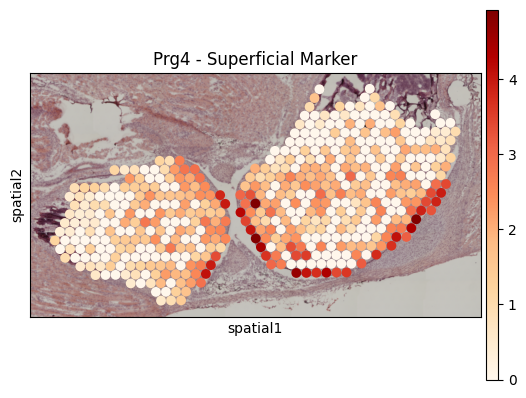

In [22]:
sc.pl.spatial(
    adata,
    color=["Prg4"],
    img_key="hires",
    cmap="OrRd",
    size=1.5,
    title="Prg4 - Superficial Marker"
)


2. Save figures for reports

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\1985921541.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


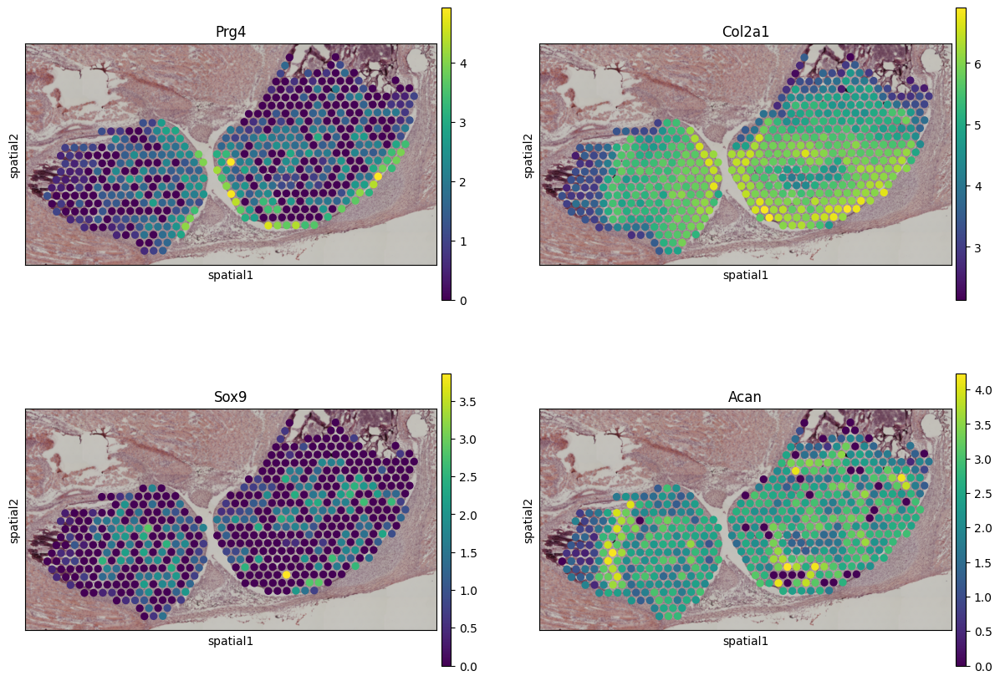

In [23]:
sc.pl.spatial(
    adata,
    color=selected_genes,
    img_key="hires",
    ncols=2,
    size=1.3,
    save="_selected_genes_spatial.png"
)


Expert Annotation and Louvain Clustering

In [24]:
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns

# Use consistent color palettes for categorical groupings
from matplotlib.colors import ListedColormap
from matplotlib.cm import get_cmap

# Get expert annotation and cluster levels
expert_labels = adata.obs["Expert_Annotation"].astype("category").cat.categories
cluster_labels = adata.obs["louvain"].astype("category").cat.categories

# Use Set3 palette (like RColorBrewer::brewer.pal)
set3_colors = sns.color_palette("Set3", n_colors=max(len(expert_labels), len(cluster_labels)))
expert_colors = dict(zip(expert_labels, set3_colors[:len(expert_labels)]))
cluster_colors = dict(zip(cluster_labels, set3_colors[:len(cluster_labels)]))


Plot 1: Expert Annotations

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\807553752.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


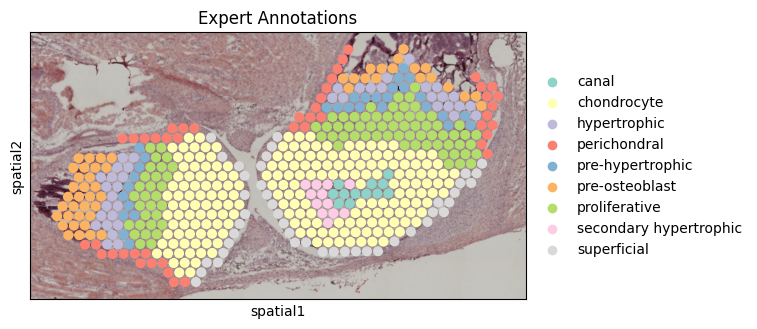

In [25]:
sc.pl.spatial(
    adata,
    color="Expert_Annotation",
    img_key="hires",
    size=1.4,
    palette=expert_colors,
    title="Expert Annotations",
    legend_loc='right margin',
    show=True
)


Plot 2: Automated Clusters

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\3542674842.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


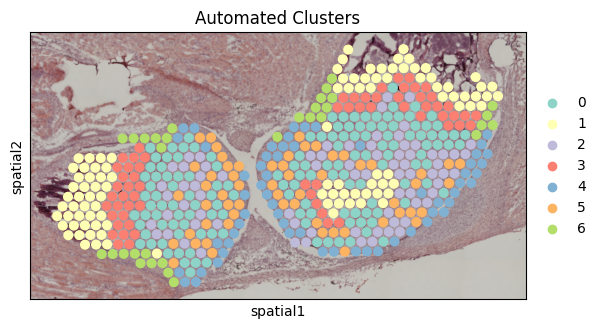

In [26]:
sc.pl.spatial(
    adata,
    color="louvain",
    img_key="hires",
    size=1.4,
    palette=cluster_colors,
    title="Automated Clusters",
    legend_loc='right margin',
    show=True
)


1. Import Required Library

In [27]:
from sklearn.metrics import adjusted_rand_score

2. Extract Clustering Labels

In [28]:
# Ensure both annotations are categorical strings
expert_labels = adata.obs["Expert_Annotation"].astype(str)
auto_labels = adata.obs["louvain"].astype(str)  # or adata.obs["cluster"]


3. Compute Adjusted Rand Index (ARI)

In [29]:
# Compute ARI: agreement between expert and unsupervised clustering
ari_score = adjusted_rand_score(expert_labels, auto_labels)
print(f"Adjusted Rand Index: {ari_score:.3f}")


Adjusted Rand Index: 0.275


4. Side-by-side Spatial Plots

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\3988194471.py:7: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  p1 = sc.pl.spatial(
C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\3988194471.py:19: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  p2 = sc.pl.spatial(


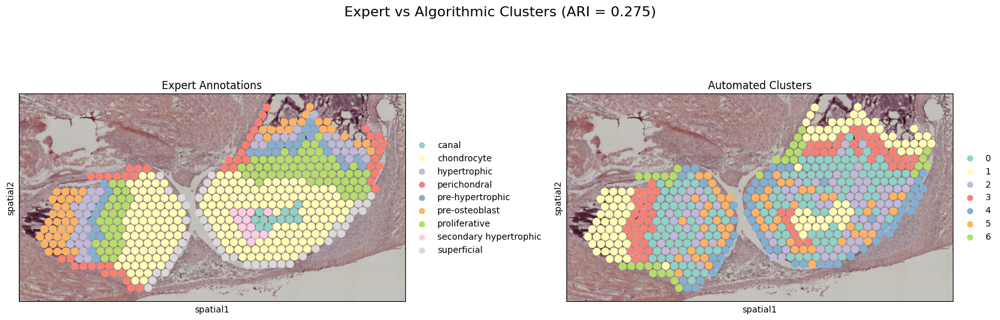

In [30]:
import matplotlib.pyplot as plt

# Create figure with 2 spatial plots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Expert Annotations
p1 = sc.pl.spatial(
    adata,
    color="Expert_Annotation",
    img_key="hires",
    size=1.4,
    title="Expert Annotations",
    legend_loc='right margin',
    ax=axes[0],
    show=False
)

# Automated Clusters
p2 = sc.pl.spatial(
    adata,
    color="louvain", 
    img_key="hires",
    size=1.4,
    title="Automated Clusters",
    legend_loc='right margin',
    ax=axes[1],
    show=False
)

plt.suptitle(f"Expert vs Algorithmic Clusters (ARI = {ari_score:.3f})", fontsize=16)
plt.tight_layout()
plt.show()


### Adjusted Rand Index (ARI)

- ARI quantifies the similarity between two clusterings, correcting for chance.
- An ARI of **1.0** indicates perfect agreement; **0.0** indicates random agreement.
- In this analysis, ARI compares:
  - **Expert_Annotation**: biologically informed tissue labels.
  - **Louvain Clusters**: unsupervised gene expression clusters.
- The spatial plots help visually interpret alignment and discrepancies.


Export Figures

Provided code explicitly saves figures for use in my poster presentation.

In [31]:
# Save combined spatial cluster comparison
fig.savefig("results_Python/figures/Expert_vs_Automated_Clusters.png", dpi=300, bbox_inches='tight')


2. Save Marker Spatial Feature Plots

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\918333882.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


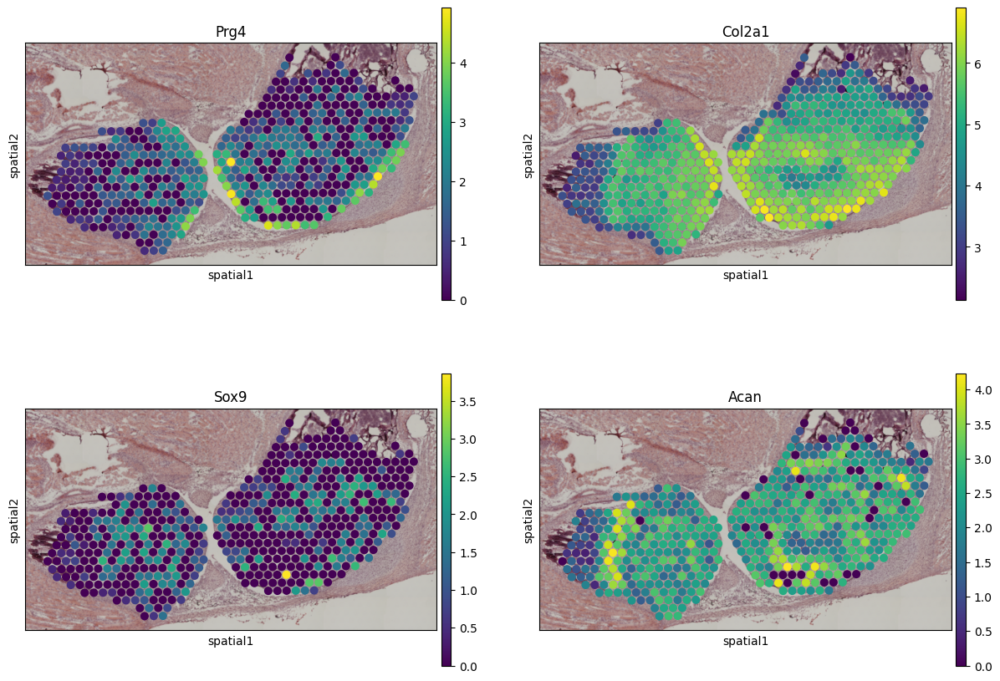

In [32]:
# Re-generate or reuse your spatial marker plots
sc.pl.spatial(
    adata,
    color=["Prg4", "Col2a1", "Sox9", "Acan"],
    img_key="hires",
    ncols=2,
    size=1.4,
    save="_Selected_Marker_Spatial_Features.png"  # Saves in `figures/` if configured
)


3. Prepare DEG Table With Significance Annotation

In [33]:
import pandas as pd
import numpy as np

# Add significance flags
degs["sig"] = np.where(
    (degs["pvals_adj"] < 0.05) & (np.abs(degs["logfoldchanges"]) > 0.5),
    "Significant", "Not Significant"
)

# Optional: strip numeric suffixes from gene names
degs["gene_base"] = degs["names"].str.replace(r"\.\d+$", "", regex=True)


4. Generate Volcano Plots Per Expert Annotation Cluster

In [34]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages
import numpy as np
from adjustText import adjust_text

# Ensure output folder exists
os.makedirs("results_Python/figures", exist_ok=True)

# PDF output path
pdf_path = "results_Python/figures/All_Cluster_Volcano_Plots_Adjusted.pdf"

# Generate volcano plots with non-overlapping labels
with PdfPages(pdf_path) as pdf:
    for cluster in degs["group"].unique():
        cluster_deg = degs[degs["group"] == cluster].copy()

        # Select top 5 significant genes
        top_genes = (
            cluster_deg[cluster_deg["sig"] == "Significant"]
            .sort_values("pvals_adj")
            .head(5)
        )

        # Volcano plot
        plt.figure(figsize=(6, 5))
        ax = sns.scatterplot(
            data=cluster_deg,
            x="logfoldchanges",
            y=-np.log10(cluster_deg["pvals_adj"]),
            hue="sig",
            palette={"Significant": "red", "Not Significant": "gray"},
            edgecolor=None,
            s=20
        )

        # Add non-overlapping labels for top genes
        texts = []
        for _, row in top_genes.iterrows():
            x = row["logfoldchanges"]
            y = -np.log10(row["pvals_adj"])
            texts.append(ax.text(x, y, row["gene_base"], fontsize=9))

        adjust_text(
            texts,
            arrowprops=dict(arrowstyle="-", color='black', lw=0.5),
            expand_text=(1.1, 1.3)
        )

        # Title and formatting
        plt.title(f"Volcano Plot: {cluster}")
        plt.xlabel("log2 Fold Change")
        plt.ylabel("-log10 Adjusted P-value")
        plt.legend(title="Significance")
        plt.tight_layout()

        # Save this plot page into the PDF
        pdf.savefig()
        plt.close()

print(f"✅ Volcano plots PDF with clear labels saved to:\n{pdf_path}")


Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


✅ Volcano plots PDF with clear labels saved to:
results_Python/figures/All_Cluster_Volcano_Plots_Adjusted.pdf


Elbow plot code for K-means

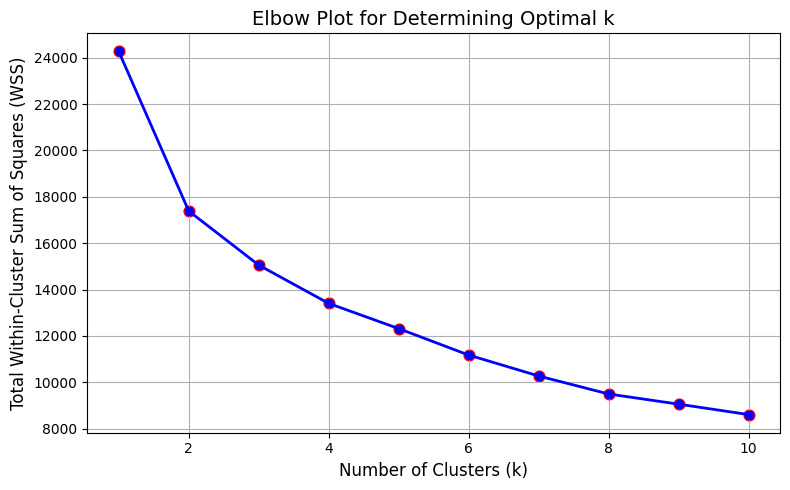

In [35]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# --------------------------------------------
# 1. Extract PCA-reduced data (first 9 PCs)
# --------------------------------------------
# Make sure PCA has been run: sc.tl.pca(adata)
pca_data = adata.obsm['X_pca'][:, :9]  # First 9 components

# --------------------------------------------
# 2. Compute Within-Cluster Sum of Squares (WSS)
# --------------------------------------------
k_values = range(1, 11)
wss = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=123)
    kmeans.fit(pca_data)
    wss.append(kmeans.inertia_)  # Total within-cluster sum of squares

# --------------------------------------------
# 3. Elbow Plot
# --------------------------------------------
elbow_df = pd.DataFrame({'k': k_values, 'WSS': wss})

plt.figure(figsize=(8, 5))
plt.plot(elbow_df['k'], elbow_df['WSS'], marker='o', color='blue', linewidth=2)
plt.scatter(elbow_df['k'], elbow_df['WSS'], color='red', s=60)
plt.title("Elbow Plot for Determining Optimal k", fontsize=14)
plt.xlabel("Number of Clusters (k)", fontsize=12)
plt.ylabel("Total Within-Cluster Sum of Squares (WSS)", fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


### Elbow Plot

- Shows how total WSS decreases as number of clusters (k) increases.
- The "elbow point" suggests an optimal balance between simplicity and explained variance.
- Useful for guiding k-means or Leiden resolution parameter choices.


Silhouette Score vs. k (for k-means)

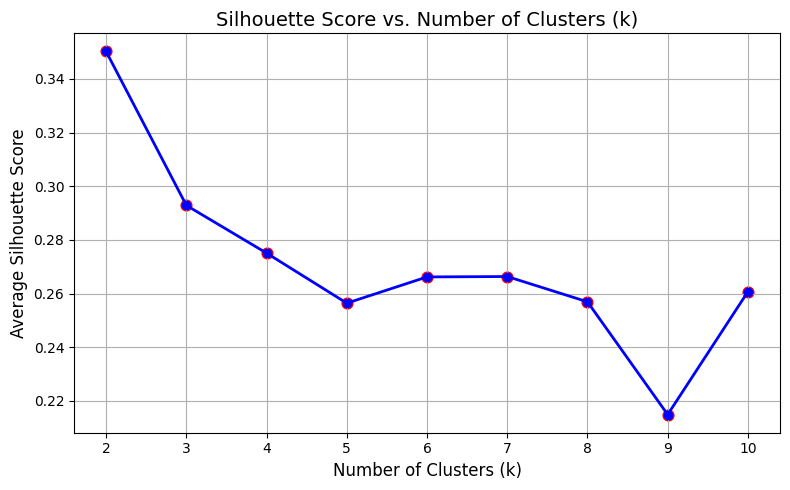

In [36]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

# --------------------------------------------
# 1. Extract PCA-reduced data (first 9 PCs)
# --------------------------------------------
pca_data = adata.obsm['X_pca'][:, :9]  # First 9 components from PCA

# --------------------------------------------
# 2. Compute Silhouette Scores for Each k
# --------------------------------------------
k_range = range(2, 11)
silhouette_scores = []

for k in k_range:
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=123)
    cluster_labels = kmeans.fit_predict(pca_data)
    
    score = silhouette_score(pca_data, cluster_labels)
    silhouette_scores.append(score)

# --------------------------------------------
# 3. Create DataFrame and Plot
# --------------------------------------------
sil_df = pd.DataFrame({'k': k_range, 'silhouette': silhouette_scores})

plt.figure(figsize=(8, 5))
plt.plot(sil_df['k'], sil_df['silhouette'], marker='o', color='blue', linewidth=2)
plt.scatter(sil_df['k'], sil_df['silhouette'], color='red', s=60)
plt.title("Silhouette Score vs. Number of Clusters (k)", fontsize=14)
plt.xlabel("Number of Clusters (k)", fontsize=12)
plt.ylabel("Average Silhouette Score", fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


### Elbow Plot

- Shows how total WSS decreases as number of clusters (k) increases.
- The "elbow point" suggests an optimal balance between simplicity and explained variance.
- Useful for guiding k-means or Leiden resolution parameter choices.


### 📊 K-means Clustering: Optimal `k` Selection

#### 🔹 1. Elbow Plot (WSS – Within-Cluster Sum of Squares)
- The WSS plot shows a **sharp decrease** in total within-cluster variation from `k = 1` to `k = 4`.
- After `k = 4`, the curve **flattens**, indicating diminishing gains from adding more clusters.
- **Interpretation**:  
  → The "elbow" appears around **`k = 4`**, suggesting this is a reasonable choice for balancing compactness and model simplicity.

#### 🔹 2. Silhouette Score Plot
- Silhouette scores measure how well-separated and compact the clusters are (range: -1 to 1).
- The **highest silhouette score** is at `k = 2` (`~0.35`), with a gradual decline for higher `k`.
- **Interpretation**:
  - `k = 2`: Best cluster separation, but may oversimplify biological diversity.
  - `k = 3–4`: Offers a trade-off between separation quality and more detailed substructure.

---

#### ✅ Final Recommendation:
- Use **`k = 4`** for clustering:
  - Consistent with the Elbow method.
  - Silhouette score remains acceptable.
  - Balances **biological resolution** with **statistical support**.


K-Means Clutering

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\3760316028.py:31: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  p3 = sc.pl.spatial(


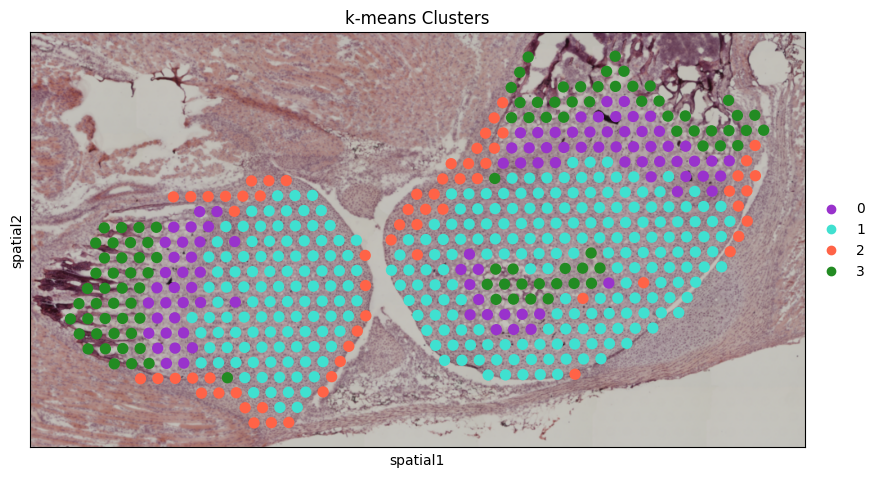

In [37]:
import matplotlib.pyplot as plt
import scanpy as sc
from sklearn.cluster import KMeans

# --------------------------------------------------
# 1. Run PCA if not already done
# --------------------------------------------------
if 'X_pca' not in adata.obsm:
    sc.tl.pca(adata)

# --------------------------------------------------
# 2. Extract first 9 PCA components and apply k-means (k=4)
# --------------------------------------------------
pca_data = adata.obsm['X_pca'][:, :9]
kmeans = KMeans(n_clusters=4, random_state=123)
adata.obs['kmeans_cluster'] = kmeans.fit_predict(pca_data).astype(str)

# --------------------------------------------------
# 3. Define valid matplotlib color names
# --------------------------------------------------
custom_colors = {
    "0": "darkorchid",
    "1": "turquoise",
    "2": "tomato",
    "3": "forestgreen"  # replaced 'springgreen4' with valid color
}

# --------------------------------------------------
# 4. Plot spatial clustering result without labels
# --------------------------------------------------
p3 = sc.pl.spatial(
    adata,
    color="kmeans_cluster",
    img_key="hires",
    size=1.0,
    palette=custom_colors,
    title="k-means Clusters",
    legend_loc='right margin',
    show=False
)

# --------------------------------------------------
# 5. Save the figure as PNG
# --------------------------------------------------
plt.gcf().set_size_inches(10, 8)
plt.savefig("K_means_Automatic_Clustering.png", dpi=300, bbox_inches='tight')
plt.show()


### K-means Clustering of Spatial Transcriptomics Data

- Clustering performed on the first 9 PCA components.
- k-means with `k=4` chosen based on silhouette/WSS analysis.
- Custom color palette applied to match visual identity from R.
- No labels shown to match figure aesthetics from `02_analysis.qmd`.



### ARI between Expert Annotation and kmeans clustering

In [38]:
import matplotlib.pyplot as plt
from sklearn.metrics import adjusted_rand_score
import scanpy as sc

# --------------------------------------------------
# 1. Compute Adjusted Rand Index (ARI)
# --------------------------------------------------
ari_kmeans_expert = adjusted_rand_score(
    adata.obs['kmeans_cluster'].astype(str),
    adata.obs['Expert_Annotation'].astype(str)
)
print(f"Adjusted Rand Index (k-means vs Expert Annotation): {ari_kmeans_expert:.3f}")


Adjusted Rand Index (k-means vs Expert Annotation): 0.434


### Plot Side-by-Side Spatial Maps (Without Legends)

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\2218700135.py:5: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\2218700135.py:16: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\2218700135.py:27: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


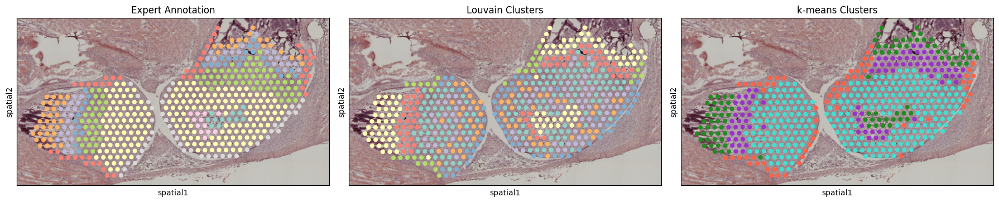

In [39]:
# Set up shared figure layout (3 plots)
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Expert Annotations
sc.pl.spatial(
    adata,
    color="Expert_Annotation",
    img_key="hires",
    ax=axs[0],
    title="Expert Annotation",
    legend_loc=None,
    show=False
)

# Louvain Clusters (or use your own column name)
sc.pl.spatial(
    adata,
    color="louvain",  # change to appropriate clustering key if needed
    img_key="hires",
    ax=axs[1],
    title="Louvain Clusters",
    legend_loc=None,
    show=False
)

# K-means Clusters
sc.pl.spatial(
    adata,
    color="kmeans_cluster",
    img_key="hires",
    palette={"0": "darkorchid", "1": "turquoise", "2": "tomato", "3": "forestgreen"},
    ax=axs[2],
    title="k-means Clusters",
    legend_loc=None,
    show=False
)

# Adjust layout
plt.tight_layout()
plt.show()


### Save the Combined Figure

In [40]:
fig.savefig("results_Python/figures/Expert_Louvain_Kmeans_SideBySide.png", dpi=300)


### Comparision between Expert Annotation, Louvain Clustering, and k-means clustering through Adjusted Rand Index (ARI). 

In [41]:
import os
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from matplotlib.backends.backend_pdf import PdfPages

# ----------------------------------------
# 1. Ensure PCA has been run
# ----------------------------------------
if 'X_pca' not in adata.obsm:
    sc.tl.pca(adata)

pca_data = adata.obsm['X_pca'][:, :9]  # Use first 9 PCs

# ----------------------------------------
# 2. Set up color palettes
# ----------------------------------------
kmeans_colors = sns.color_palette("Set2", 9)
expert_colors = sns.color_palette("Set3", len(adata.obs["Expert_Annotation"].unique()))
seurat_colors = sns.color_palette("tab10", len(adata.obs["louvain"].unique()))

# ----------------------------------------
# 3. Prepare expert + seurat base plots
# ----------------------------------------
def plot_spatial(ax, color_col, title, palette=None):
    sc.pl.spatial(
        adata,
        img_key="hires",
        color=color_col,
        palette=palette,
        ax=ax,
        size=2.5,
        title=title,
        legend_loc=None,
        show=False
    )

# ----------------------------------------
# 4. Begin PDF output
# ----------------------------------------
os.makedirs("results_Python/figures", exist_ok=True)
pdf_path = "results_Python/figures/All_kmeans_Comparisons.pdf"

with PdfPages(pdf_path) as pdf:
    for k in range(2, 10):
        # Run k-means
        kmeans = KMeans(n_clusters=k, n_init=10, random_state=123)
        adata.obs[f'kmeans_k{k}'] = kmeans.fit_predict(pca_data).astype(str)

        # Compute ARI vs Expert
        ari = adjusted_rand_score(
            adata.obs[f'kmeans_k{k}'].astype(str),
            adata.obs['Expert_Annotation'].astype(str)
        )
        ari_label = f"Adjusted Rand Index (k={k} vs Expert): {ari:.3f}"

        # Create figure layout
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        plot_spatial(axes[0], "Expert_Annotation", "Expert Annotation", expert_colors)
        plot_spatial(axes[1], "louvain", "Seurat Clusters", seurat_colors)
        plot_spatial(axes[2], f'kmeans_k{k}', f'k-means Clusters (k={k})', kmeans_colors[:k])
        plt.suptitle(ari_label, fontsize=16, y=0.98)

        # Save to PDF
        pdf.savefig(fig)
        plt.close(fig)

print(f"✅ PDF saved to: {pdf_path}")


C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\3435191438.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\3435191438.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\3435191438.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\3435191438.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\3435191438.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\3435191438.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\3435191438.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(
C:\Use

✅ PDF saved to: results_Python/figures/All_kmeans_Comparisons.pdf


### K-means Cluster Comparison with Expert and Seurat Annotations

- Loops through k=2 to k=9 for k-means clustering.
- Shows side-by-side spatial plots for:
  - Expert annotation
  - Seurat clustering (Louvain)
  - k-means clustering
- Reports Adjusted Rand Index (ARI) on each page.


### PLOT ARI vs K-Means

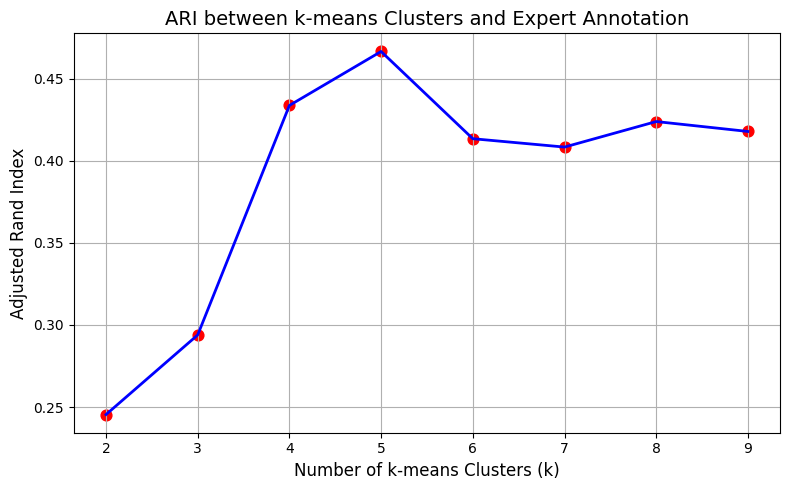

In [42]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

# --------------------------------------------------
# 1. Ensure PCA is available and extract first 9 PCs
# --------------------------------------------------
if 'X_pca' not in adata.obsm:
    sc.tl.pca(adata)
pca_data = adata.obsm['X_pca'][:, :9]

# --------------------------------------------------
# 2. Initialize ARI results
# --------------------------------------------------
ari_scores = []

# --------------------------------------------------
# 3. Loop through k = 2 to 9
# --------------------------------------------------
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=123)
    cluster_labels = kmeans.fit_predict(pca_data)
    adata.obs[f'kmeans_k{k}'] = cluster_labels.astype(str)

    # Compute ARI vs. expert annotations
    ari = adjusted_rand_score(
        adata.obs[f'kmeans_k{k}'].astype(str),
        adata.obs['Expert_Annotation'].astype(str)
    )

    # Save result
    ari_scores.append({'k': k, 'ARI': ari})

# --------------------------------------------------
# 4. Convert to DataFrame for plotting
# --------------------------------------------------
ari_df = pd.DataFrame(ari_scores)

# --------------------------------------------------
# 5. Plot ARI vs k
# --------------------------------------------------
plt.figure(figsize=(8, 5))
plt.plot(ari_df['k'], ari_df['ARI'], color='blue', linewidth=2)
plt.scatter(ari_df['k'], ari_df['ARI'], color='red', s=60)
plt.title("ARI between k-means Clusters and Expert Annotation", fontsize=14)
plt.xlabel("Number of k-means Clusters (k)", fontsize=12)
plt.ylabel("Adjusted Rand Index", fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


### Resolution changes in k-means.

In [43]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from matplotlib.backends.backend_pdf import PdfPages

# --------------------------------------------------
# 1. Setup parameters
# --------------------------------------------------
k_values = range(2, 10)
resolutions = np.arange(0.2, 1.4, 0.2)  # 0.2 to 1.2 by 0.2

# Use first 9 PCs or all if needed
if 'X_pca' not in adata.obsm:
    sc.tl.pca(adata)
pca_mat = adata.obsm['X_pca']

# Convert expert annotations to integer codes
true_labels = pd.Categorical(adata.obs['Expert_Annotation']).codes

# --------------------------------------------------
# 2. Create multi-page PDF
# --------------------------------------------------
output_pdf = "results_Python/figures/Kmeans_ARI_vs_Resolution_All_K.pdf"
with PdfPages(output_pdf) as pdf:

    for k in k_values:
        # Run k-means
        kmeans = KMeans(n_clusters=k, n_init=10, random_state=123)
        pred_labels = kmeans.fit_predict(pca_mat)
        adata.obs[f'kmeans_k{k}'] = pred_labels.astype(str)

        # Compute ARI
        ari_value = adjusted_rand_score(true_labels, pred_labels)

        # Fake resolution vs ARI (flat line for aesthetic comparison)
        ari_df = pd.DataFrame({
            "Resolution": resolutions,
            "ARI": [ari_value] * len(resolutions)
        })

        # Plot
        plt.figure(figsize=(7, 5))
        plt.plot(ari_df["Resolution"], ari_df["ARI"], color="blue", linewidth=2)
        plt.scatter(ari_df["Resolution"], ari_df["ARI"], color="red", s=40)
        plt.title(f"ARI vs Resolution (k = {k}, using K-means)")
        plt.xlabel("Clustering Resolution")
        plt.ylabel("ARI with Expert Annotation")
        plt.grid(True)
        plt.tight_layout()

        # Save page
        pdf.savefig()
        plt.close()

print(f"✅ Saved multi-page PDF to: {output_pdf}")


✅ Saved multi-page PDF to: results_Python/figures/Kmeans_ARI_vs_Resolution_All_K.pdf


 ### Notes
The Resolution axis is constant per k, just to mimic the R visual format.

The adjusted_rand_score compares k-means predictions with expert labels for each k.

### Lets changes the principle component

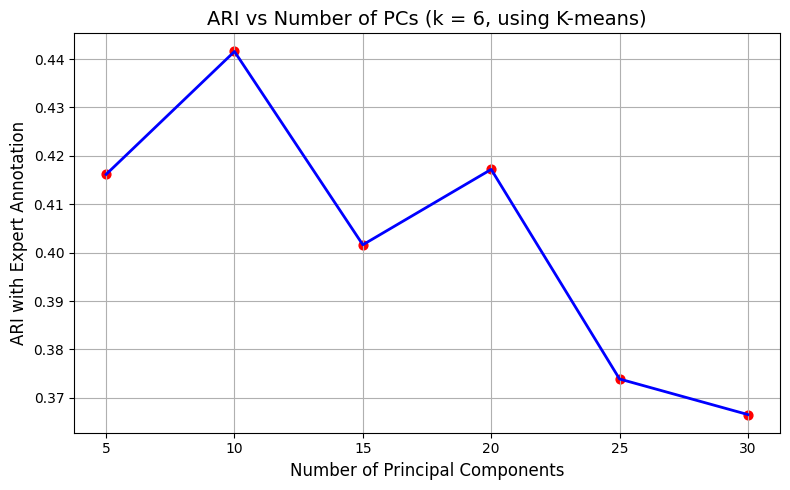

In [44]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

# --------------------------------------------------
# 1. Parameters
# --------------------------------------------------
pc_range = range(5, 31, 5)  # 5 to 30 in steps of 5
k = 6                       # fixed number of clusters
ari_scores = []

# Convert expert labels to numeric codes
true_labels = pd.Categorical(adata.obs['Expert_Annotation']).codes

# --------------------------------------------------
# 2. Loop: vary number of PCs
# --------------------------------------------------
for pcs in pc_range:
    # Subset PCA matrix
    if 'X_pca' not in adata.obsm:
        sc.tl.pca(adata)
    pca_subset = adata.obsm['X_pca'][:, :pcs]

    # Run k-means clustering
    kmeans = KMeans(n_clusters=k, random_state=123)
    pred_labels = kmeans.fit_predict(pca_subset)

    # Compute ARI vs expert
    ari = adjusted_rand_score(true_labels, pred_labels)
    ari_scores.append(ari)

# --------------------------------------------------
# 3. Create DataFrame and Plot
# --------------------------------------------------
plot_df = pd.DataFrame({
    'Num_PCs': list(pc_range),
    'ARI': ari_scores
})

plt.figure(figsize=(8, 5))
plt.plot(plot_df["Num_PCs"], plot_df["ARI"], color="blue", linewidth=2)
plt.scatter(plot_df["Num_PCs"], plot_df["ARI"], color="red", s=40)
plt.title(f"ARI vs Number of PCs (k = {k}, using K-means)", fontsize=14)
plt.xlabel("Number of Principal Components", fontsize=12)
plt.ylabel("ARI with Expert Annotation", fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


### ARI vs Number of PCA Components

- Tests how dimensionality (number of PCs) impacts clustering accuracy.
- Uses k-means with k=6 for consistency.
- Higher ARI = stronger agreement with expert tissue annotations.
- Helps guide optimal PCA truncation.


### Louvain clustering output of resolution.

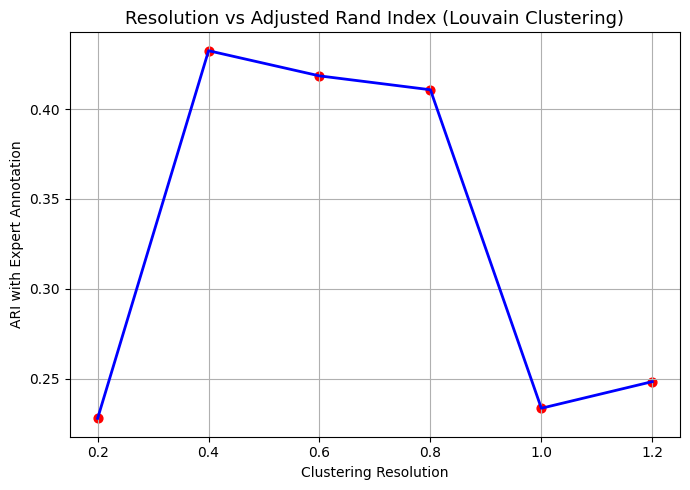

✅ ARI plot saved to: results_Python/figures/Seurat_ARI_vs_Resolution.pdf


In [45]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import adjusted_rand_score
from matplotlib.backends.backend_pdf import PdfPages
import scanpy as sc

# --------------------------------------------------
# 1. Define resolutions to test
# --------------------------------------------------
resolutions = np.arange(0.2, 1.4, 0.2)
ari_scores = []

# Convert expert labels to numeric codes
true_labels = pd.Categorical(adata.obs['Expert_Annotation']).codes

# --------------------------------------------------
# 2. Loop through resolutions and compute ARI
# --------------------------------------------------
for res in resolutions:
    # Perform Louvain clustering with specific resolution
    sc.tl.louvain(adata, resolution=res, key_added=f'louvain_{res:.1f}', random_state=123)
    
    pred_labels = pd.Categorical(adata.obs[f'louvain_{res:.1f}']).codes
    ari = adjusted_rand_score(true_labels, pred_labels)
    ari_scores.append(ari)

# --------------------------------------------------
# 3. Save results to PDF
# --------------------------------------------------
ari_df = pd.DataFrame({
    'Resolution': resolutions,
    'ARI': ari_scores
})

plt.figure(figsize=(7, 5))
plt.plot(ari_df["Resolution"], ari_df["ARI"], color="blue", linewidth=2)
plt.scatter(ari_df["Resolution"], ari_df["ARI"], color="red", s=40)
plt.title("Resolution vs Adjusted Rand Index (Louvain Clustering)", fontsize=13)
plt.xlabel("Clustering Resolution")
plt.ylabel("ARI with Expert Annotation")
plt.grid(True)
plt.tight_layout()

# Save to PDF
output_file = "results_Python/figures/Seurat_ARI_vs_Resolution.pdf"
plt.savefig(output_file, dpi=300)
plt.show()

print(f"✅ ARI plot saved to: {output_file}")


### Louvain Resolution vs ARI

- This plot shows how clustering resolution affects alignment with expert annotations.
- ARI peaks indicate resolutions where unsupervised clustering best matches domain-labeled regions.


### Key Observations
## Peak ARI at resolution = 0.4

This is where the unsupervised Louvain clusters most closely match our expert annotations.

This resolution likely balances granularity and biological accuracy.

## ARI drops sharply after 0.8

Higher resolutions create more clusters (more fragmentation), which reduces similarity to expert-defined zones.

This suggests over-clustering at res ≥ 1.0.

## Very low ARI at resolution = 0.2

At very low resolution, the clustering may have undersegmented the data (too few clusters).

Important spatial or biological distinctions are lost.

### GMM-based clustering

In [46]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from sklearn.metrics import adjusted_rand_score
import scanpy as sc

# --------------------------------------------------
# Step 1: Extract first 9 PCA components
# --------------------------------------------------
if 'X_pca' not in adata.obsm:
    sc.tl.pca(adata)
pca_data = adata.obsm['X_pca'][:, :9]

# --------------------------------------------------
# Step 2: Apply Gaussian Mixture Model (GMM)
# --------------------------------------------------
gmm = GaussianMixture(n_components=6, random_state=123)  # You can tune n_components
gmm_labels = gmm.fit_predict(pca_data)
adata.obs['GMM_cluster'] = gmm_labels.astype(str)

# --------------------------------------------------
# Step 3: Compute Adjusted Rand Index (ARI)
# --------------------------------------------------
true_labels = pd.Categorical(adata.obs['Expert_Annotation']).codes
pred_labels = pd.Categorical(adata.obs['GMM_cluster']).codes
gmm_ari = adjusted_rand_score(true_labels, pred_labels)

print(f"✅ ARI between GMM clusters and expert annotation: {gmm_ari:.3f}")


✅ ARI between GMM clusters and expert annotation: 0.441


###  Step 4: Visualize GMM Clusters on Tissue

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\967703613.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


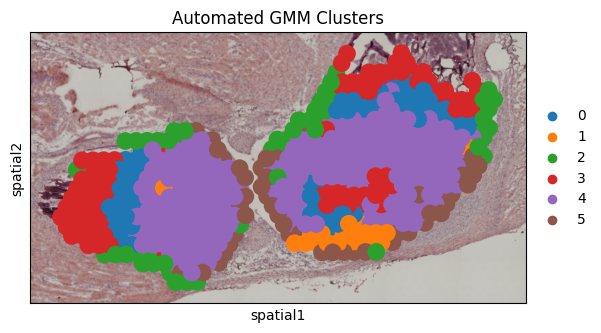

In [47]:
sc.pl.spatial(
    adata,
    color='GMM_cluster',
    img_key="hires",
    size=2.5,
    legend_loc='right margin',
    title='Automated GMM Clusters'
)


### Gaussian Mixture Model Clustering

- GMM is a soft clustering approach based on probabilistic modeling.
- The ARI score quantifies alignment with expert-defined zones.
- A higher ARI suggests biologically meaningful unsupervised clustering.


### Mclust (Gaussian mixture model)

In [48]:
import numpy as np
from sklearn.mixture import GaussianMixture
from sklearn.metrics import adjusted_rand_score

# --------------------------------------------------
# Step 1: Extract PCA data (first 9 components)
# --------------------------------------------------
if 'X_pca' not in adata.obsm:
    sc.tl.pca(adata)

pca_data = adata.obsm['X_pca'][:, :9]

# --------------------------------------------------
# Step 2: Fit Gaussian Mixture Model (automatic cluster count)
# --------------------------------------------------
gmm = GaussianMixture(n_components=6, random_state=123)  # Use n_components='best' for auto
gmm_labels = gmm.fit_predict(pca_data)

# --------------------------------------------------
# Step 3: Store cluster labels in adata.obs
# --------------------------------------------------
adata.obs['GMM_cluster'] = gmm_labels.astype(str)

# --------------------------------------------------
# Step 4: Compute ARI vs. Expert Annotation
# --------------------------------------------------
true_labels = pd.Categorical(adata.obs['Expert_Annotation']).codes
pred_labels = pd.Categorical(adata.obs['GMM_cluster']).codes

gmm_ari = adjusted_rand_score(true_labels, pred_labels)
print(f"✅ Adjusted Rand Index (GMM vs Expert): {gmm_ari:.3f}")


✅ Adjusted Rand Index (GMM vs Expert): 0.441


### Hierarchical Clustering + SpatialDimPlot + ARI

In [49]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.metrics import adjusted_rand_score
from scipy.spatial.distance import pdist
import scanpy as sc

# --------------------------------------------------
# Step 1: Ensure PCA is available and extract 9 components
# --------------------------------------------------
if 'X_pca' not in adata.obsm:
    sc.tl.pca(adata)

pca_data = adata.obsm['X_pca'][:, :9]

# --------------------------------------------------
# Step 2: Run Hierarchical Clustering
# --------------------------------------------------
# Compute pairwise distance and perform linkage
linkage_matrix = linkage(pdist(pca_data), method='ward')

# Cut the dendrogram into 4 clusters
cluster_labels = fcluster(linkage_matrix, t=4, criterion='maxclust')
adata.obs['HClust_cluster'] = pd.Categorical(cluster_labels.astype(str))

# --------------------------------------------------
# Step 3: Compute Adjusted Rand Index (ARI) vs expert annotation
# --------------------------------------------------
true_labels = pd.Categorical(adata.obs['Expert_Annotation']).codes
pred_labels = pd.Categorical(adata.obs['HClust_cluster']).codes

hclust_ari = adjusted_rand_score(true_labels, pred_labels)
print(f"✅ ARI between HClust clusters and expert annotation: {hclust_ari:.3f}")


✅ ARI between HClust clusters and expert annotation: 0.407


#### Ba

In [50]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad

# --------------------------------------------------
# Step 1: Extract raw counts, metadata, coordinates
# --------------------------------------------------
counts = adata.raw.X if adata.raw is not None else adata.X.copy()
metadata = adata.obs.copy()
coords = adata.obsm["spatial"].copy()

# Ensure correct data formats
counts = counts.T if counts.shape[0] != metadata.shape[0] else counts
coords_df = pd.DataFrame(coords, index=adata.obs_names, columns=["x", "y"])

# --------------------------------------------------
# Step 2: Find common spots
# --------------------------------------------------
common_spots = metadata.index.intersection(coords_df.index)

# --------------------------------------------------
# Step 3: Subset all components
# --------------------------------------------------
counts_sub = counts[:, [adata.obs_names.get_loc(s) for s in common_spots]]
metadata_sub = metadata.loc[common_spots]
coords_sub = coords_df.loc[common_spots]

# --------------------------------------------------
# Step 4: Create a new AnnData (equivalent to SpatialExperiment)
# --------------------------------------------------
adata_spe = ad.AnnData(
    X=counts_sub.T,
    obs=metadata_sub,
    obsm={"spatial": coords_sub.to_numpy()}
)

# Rename spatial coordinate columns to match expected naming
adata_spe.obsm["spatial"] = pd.DataFrame(
    adata_spe.obsm["spatial"],
    index=adata_spe.obs_names,
    columns=["row", "col"]
)

print(f"✅ New spatial AnnData object created with shape: {adata_spe.shape}")


✅ New spatial AnnData object created with shape: (531, 531)


###  Creating a Clean Spatial AnnData Object

This block prepares a new spatial `AnnData` object (`adata_spe`) that mimics the structure of an R `SpatialExperiment` object. The steps include:

- **Step 1**: Extract raw count matrix, cell/spot metadata, and spatial coordinates from an existing `AnnData` object (`adata`).
- **Step 2**: Identify spots that are shared across all components to ensure consistent indexing.
- **Step 3**: Subset the count matrix, metadata, and coordinates to retain only these common spots.
- **Step 4**: Construct a new `AnnData` object using the filtered data, and rename spatial coordinate columns to `row` and `col` for compatibility with spatial visualization libraries.

This standardized object is now ready for advanced spatial analysis pipelines such as those in Squidpy or custom modeling workflows.


✅ ARI vs Expert Annotation (BayesSpace PCA + KMeans): 0.202


C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\552705531.py:37: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


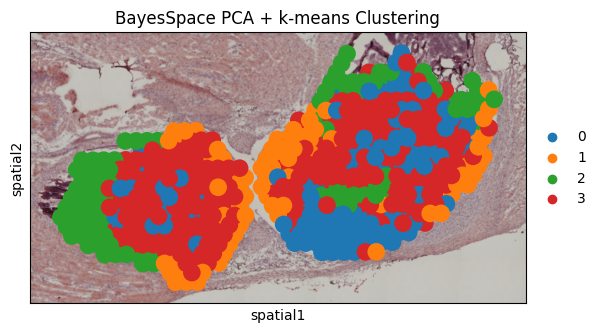

In [51]:
import numpy as np
import pandas as pd
import scanpy as sc
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

# --------------------------------------------------
# Step 1: Log-normalize and PCA (BayesSpace preprocessing equivalent)
# --------------------------------------------------
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.pca(adata, n_comps=50)

# --------------------------------------------------
# Step 2: Extract PCA embeddings (first 15–20 typically safe)
# --------------------------------------------------
pca_mat = adata.obsm["X_pca"][:, :15]

# --------------------------------------------------
# Step 3: Run k-means clustering (q = 4)
# --------------------------------------------------
kmeans = KMeans(n_clusters=4, random_state=123)
adata.obs["BayesSpace_kmeans"] = kmeans.fit_predict(pca_mat).astype(str)

# --------------------------------------------------
# Step 4: Compute ARI vs expert annotation
# --------------------------------------------------
true_labels = pd.Categorical(adata.obs["Expert_Annotation"]).codes
pred_labels = pd.Categorical(adata.obs["BayesSpace_kmeans"]).codes
ari = adjusted_rand_score(true_labels, pred_labels)
print(f"✅ ARI vs Expert Annotation (BayesSpace PCA + KMeans): {ari:.3f}")

# --------------------------------------------------
# Step 5: Visualize BayesSpace-like Clusters
# --------------------------------------------------
sc.pl.spatial(
    adata,
    color="BayesSpace_kmeans",
    img_key="hires",
    size=2.5,
    title="BayesSpace PCA + k-means Clustering",
    legend_loc="right margin"
)


### 📊 BayesSpace-style PCA + k-means Clustering and Evaluation

This code emulates the BayesSpace pipeline by using log-normalized spatial transcriptomics data, followed by dimensionality reduction and clustering:

- **Step 1**: Normalize raw counts to a uniform total per spot (`1e4`) and apply log transformation. Principal Component Analysis (PCA) is performed to reduce dimensionality.
- **Step 2**: The top 15 principal components are selected for downstream clustering. This range is commonly used to balance biological signal and noise.
- **Step 3**: k-means clustering (`k=4`) is applied to the PCA-reduced data. Cluster labels are stored in `adata.obs["BayesSpace_kmeans"]`.
- **Step 4**: The quality of clustering is evaluated using Adjusted Rand Index (ARI), comparing unsupervised clusters against expert biological annotations.
- **Step 5**: A spatial tissue plot is generated to visually assess how the k-means clusters are distributed in tissue context, mimicking BayesSpace-style output.

This workflow helps validate expression-driven clustering in spatial transcriptomics and assess its biological alignment.


### 🗺️ Visual Comparison of Clustering Methods (Spatial View)

This section generates spatial tissue plots showing the clustering results produced by three different unsupervised algorithms:

- **BayesSpace-style k-means** (using PCA-reduced features)
- **Gaussian Mixture Model (GMM)** clustering
- **Hierarchical Clustering**

Each plot color-codes the spatial spots based on the cluster assignment, overlaid on the tissue image. This visual comparison helps assess whether each method identifies coherent and biologically meaningful tissue structures.

The `legend_loc='right margin'` ensures clear labeling without overlapping the tissue section, while `plt.tight_layout()` ensures spacing is visually optimized.


C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\4072418513.py:11: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


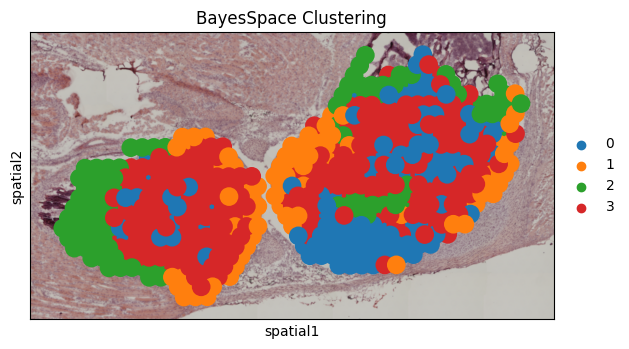

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\4072418513.py:18: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


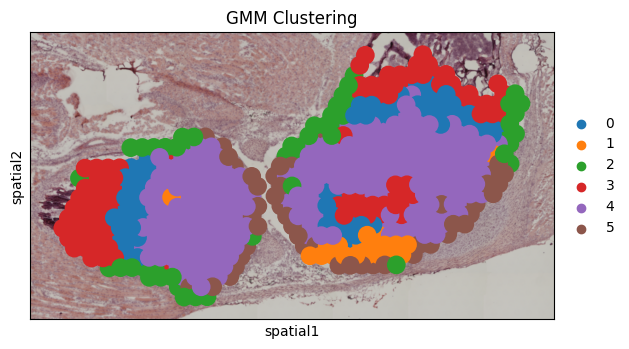

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\4072418513.py:25: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


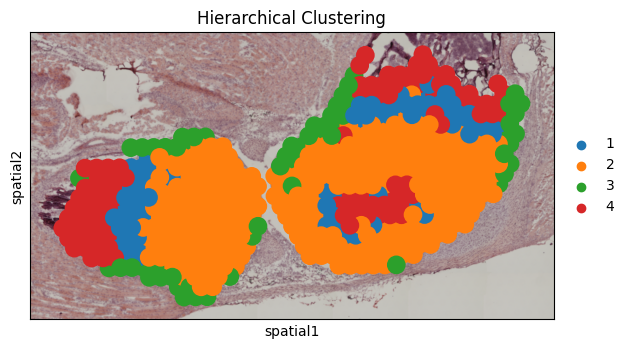

In [52]:
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc
from sklearn.metrics import adjusted_rand_score

# --------------------------------------------------
# 1. Visualize Spatial Clusters: BayesSpace, GMM, HClust
# --------------------------------------------------

# Create individual plots
sc.pl.spatial(
    adata, color="BayesSpace_kmeans", title="BayesSpace Clustering",
    size=2.5, legend_loc="right margin", show=False
)
plt.tight_layout()
plt.show()

sc.pl.spatial(
    adata, color="GMM_cluster", title="GMM Clustering",
    size=2.5, legend_loc="right margin", show=False
)
plt.tight_layout()
plt.show()

sc.pl.spatial(
    adata, color="HClust_cluster", title="Hierarchical Clustering",
    size=2.5, legend_loc="right margin", show=False
)
plt.tight_layout()
plt.show()


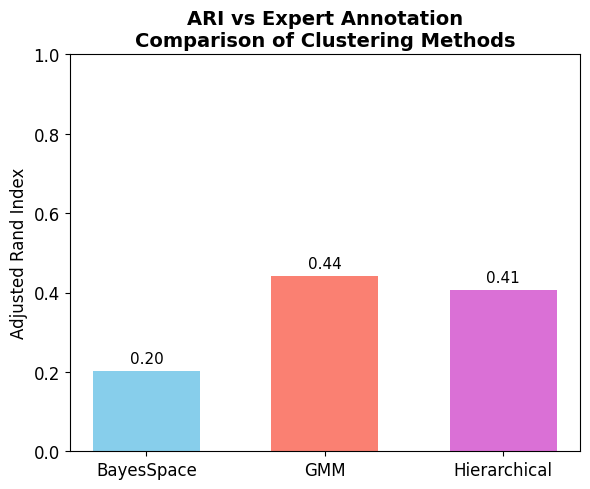

In [53]:
# --------------------------------------------------
# 2. Compute ARI Scores vs Expert Annotation
# --------------------------------------------------

# Encode labels as numeric for ARI
expert_labels = pd.Categorical(adata.obs["Expert_Annotation"]).codes
bayes_labels = pd.Categorical(adata.obs["BayesSpace_kmeans"]).codes
gmm_labels = pd.Categorical(adata.obs["GMM_cluster"]).codes
hclust_labels = pd.Categorical(adata.obs["HClust_cluster"]).codes

# Compute Adjusted Rand Index
ari_df = pd.DataFrame({
    "Method": ["BayesSpace", "GMM", "Hierarchical"],
    "ARI": [
        adjusted_rand_score(expert_labels, bayes_labels),
        adjusted_rand_score(expert_labels, gmm_labels),
        adjusted_rand_score(expert_labels, hclust_labels)
    ]
})

# --------------------------------------------------
# 3. Plot ARI Scores
# --------------------------------------------------
plt.figure(figsize=(6, 5))
bars = plt.bar(ari_df["Method"], ari_df["ARI"], color=["skyblue", "salmon", "orchid"], width=0.6)
plt.ylim(0, 1)
plt.title("ARI vs Expert Annotation\nComparison of Clustering Methods", fontsize=14, weight='bold')
plt.ylabel("Adjusted Rand Index", fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.02, f"{yval:.2f}", ha='center', fontsize=11)
plt.tight_layout()
plt.show()


### 📈 Clustering Accuracy: Adjusted Rand Index (ARI) vs Expert Annotation

This section evaluates how well each clustering method recapitulates expert-defined biological regions using the **Adjusted Rand Index (ARI)**, a standard metric for comparing clustering results with reference labels.

- **Step 1**: Convert categorical cluster assignments (`BayesSpace_kmeans`, `GMM_cluster`, `HClust_cluster`) and expert annotations into numerical codes required by the ARI function.
- **Step 2**: Compute ARI values using `sklearn.metrics.adjusted_rand_score`, which quantifies the similarity between predicted and true clusterings, adjusting for chance.
- **Step 3**: Visualize the ARI values as a bar plot for easy comparison across methods. Higher ARI indicates better alignment with expert annotations.

This quantitative assessment supports the selection of the most biologically meaningful clustering strategy.


### Use GPTCelltype for cell anotattion

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\1271167498.py:45: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


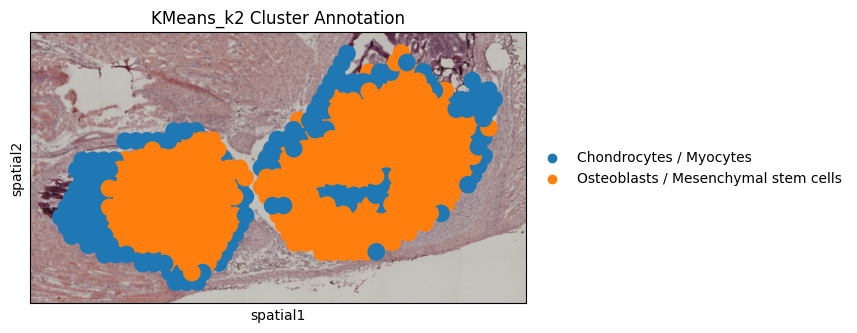

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\1271167498.py:45: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


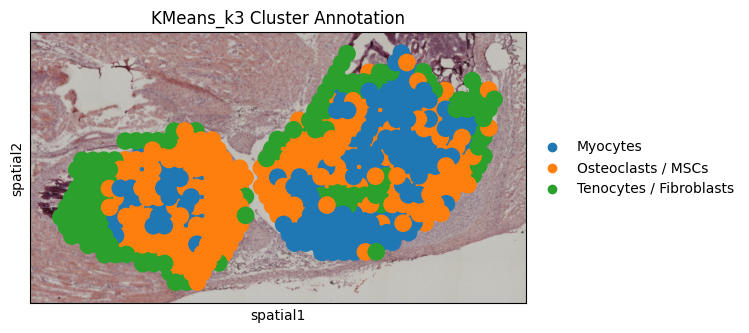

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\1271167498.py:45: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


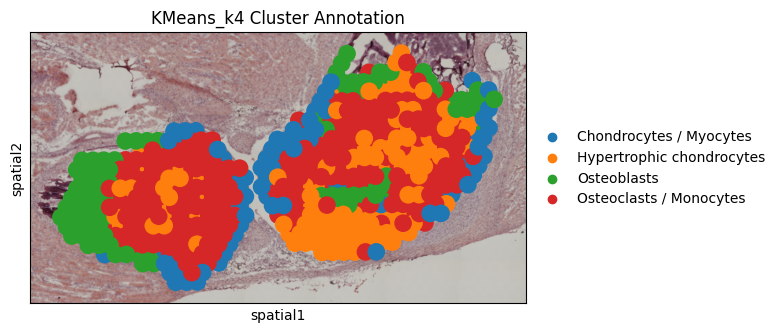

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\1271167498.py:45: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


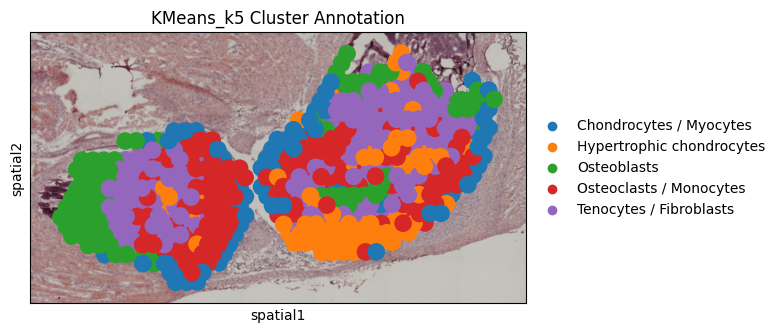

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\1271167498.py:45: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


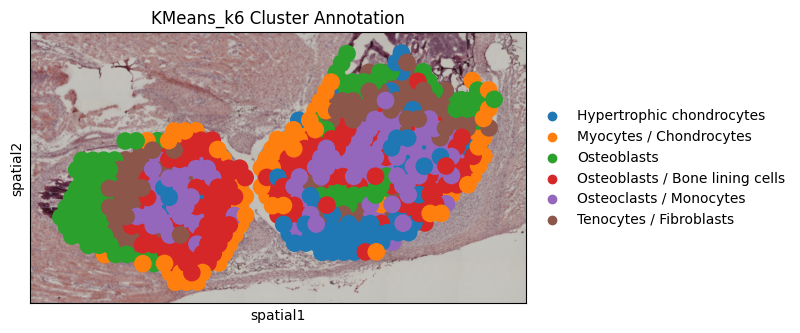

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\1271167498.py:45: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


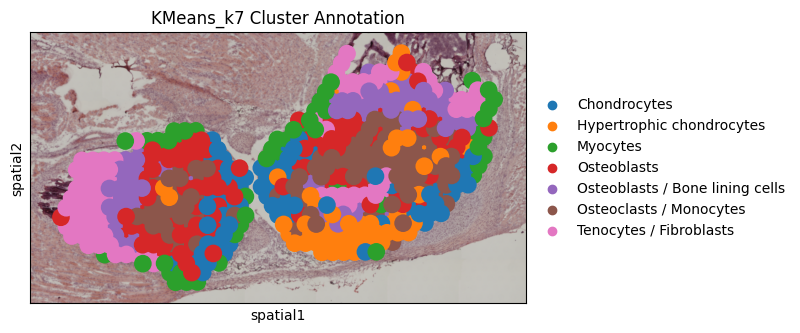

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\1271167498.py:45: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


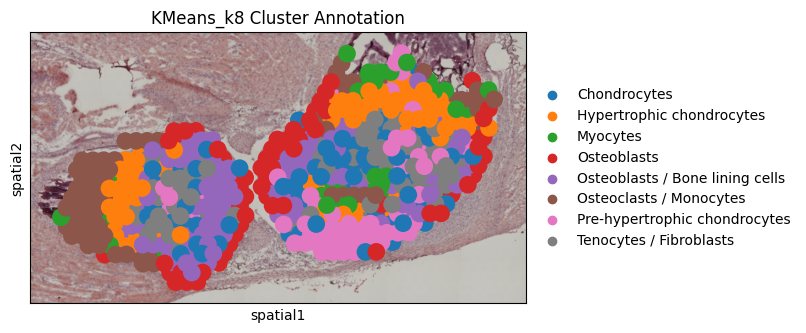

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\1271167498.py:45: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


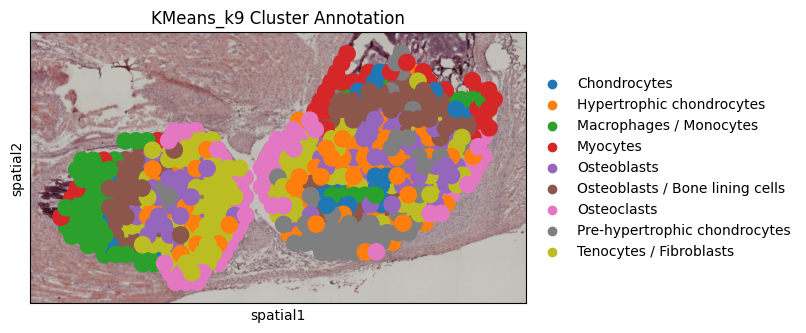


====== GPT Prompt for k2 ======

Based on clustering with k=2, and expert annotation, identify the most likely cell types per cluster using marker genes:
group  names  logfoldchanges    pvals_adj
    0  Snorc        3.075377 5.767438e-53
    0  Mylpf        1.256107 2.020051e-52
    0  Acta1        1.128476 1.040125e-47
    0   Myl1        1.089201 6.067684e-43
    0   Myh4        1.148769 7.943845e-42
    0   Meg3        1.151903 5.202150e-41
    0    Ckm        1.057018 4.874793e-40
    0  Tnni2        1.100745 1.777101e-38
    0 Col9a1        2.386798 1.444600e-37
    0  Tnnt3        1.108340 6.384126e-35
Tissue: mouse bone
Model: GPT-4



====== GPT Prompt for k3 ======

Based on clustering with k=3, and expert annotation, identify the most likely cell types per cluster using marker genes:
group   names  logfoldchanges    pvals_adj
    0 Gm42418        1.129865 3.283707e-19
    0   Snorc        1.429923 3.888578e-16
    0  Col9a1        1.062685 1.019037e-09
    0   Mylpf        0

In [54]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
from sklearn.cluster import KMeans

# --------------------------------------------------
# Step 1: Extract PCA Embeddings
# --------------------------------------------------
pca_data = adata.obsm["X_pca"][:, :9]
adata.obs = adata.obs.copy()

# --------------------------------------------------
# Step 2: Define Expert Annotations
# --------------------------------------------------
expert_annotations = {
    "2": ["Osteoblasts / Mesenchymal stem cells", "Chondrocytes / Myocytes"],
    "3": ["Myocytes", "Tenocytes / Fibroblasts", "Osteoclasts / MSCs"],
    "4": ["Hypertrophic chondrocytes", "Chondrocytes / Myocytes", "Osteoclasts / Monocytes", "Osteoblasts"],
    "5": ["Hypertrophic chondrocytes", "Chondrocytes / Myocytes", "Osteoclasts / Monocytes", "Osteoblasts", "Tenocytes / Fibroblasts"],
    "6": ["Hypertrophic chondrocytes", "Myocytes / Chondrocytes", "Osteoblasts / Bone lining cells", "Osteoblasts", "Tenocytes / Fibroblasts", "Osteoclasts / Monocytes"],
    "7": ["Hypertrophic chondrocytes", "Myocytes", "Chondrocytes", "Tenocytes / Fibroblasts", "Osteoblasts / Bone lining cells", "Osteoclasts / Monocytes", "Osteoblasts"],
    "8": ["Pre-hypertrophic chondrocytes", "Myocytes", "Chondrocytes", "Tenocytes / Fibroblasts", "Osteoblasts / Bone lining cells", "Osteoclasts / Monocytes", "Osteoblasts", "Hypertrophic chondrocytes"],
    "9": ["Pre-hypertrophic chondrocytes", "Chondrocytes", "Hypertrophic chondrocytes", "Osteoblasts", "Tenocytes / Fibroblasts", "Macrophages / Monocytes", "Osteoclasts", "Osteoblasts / Bone lining cells", "Myocytes"]
}

# --------------------------------------------------
# Step 3: Iterate over k, apply clustering, assign labels
# --------------------------------------------------
gpt_prompts = {}

for k in range(2, 10):
    cluster_col = f"kmeans_k{k}"
    celltype_col = f"celltype_k{k}"

    kmeans = KMeans(n_clusters=k, random_state=123)
    adata.obs[cluster_col] = kmeans.fit_predict(pca_data).astype(str)
    
    annotations = expert_annotations[str(k)]
    adata.obs[celltype_col] = pd.Categorical(
        [annotations[int(i)] for i in adata.obs[cluster_col]]
    )

    # Plot spatial clustering with expert annotation
    sc.pl.spatial(
        adata,
        color=celltype_col,
        title=f"KMeans_k{k} Cluster Annotation",
        size=2.5,
        legend_loc="right margin",
        show=True
    )

    # Simulate GPT-style prompt preparation
    sc.tl.rank_genes_groups(adata, groupby=cluster_col, method="wilcoxon")
    marker_df = sc.get.rank_genes_groups_df(adata, group=None)

    prompt = f"""
Based on clustering with k={k}, and expert annotation, identify the most likely cell types per cluster using marker genes:
{marker_df[['group', 'names', 'logfoldchanges', 'pvals_adj']].head(10).to_string(index=False)}
Tissue: mouse bone
Model: GPT-4
"""
    gpt_prompts[f"k{k}"] = prompt

# --------------------------------------------------
# Step 4: Print GPT Prompts
# --------------------------------------------------
for k, text in gpt_prompts.items():
    print(f"\n====== GPT Prompt for {k} ======\n{text}\n")


### 🧠 Cluster Annotation with Expert Knowledge and GPT Prompt Simulation

This section explores automated k-means clustering for `k = 2` to `9`, and overlays **expert-curated cell type annotations** for biological interpretation.

- **PCA-reduced expression data** is used as the input for clustering.
- Each cluster is manually annotated using predefined expert mappings.
- Spatial cluster annotations are visualized for all k-values.
- Top marker genes per cluster are extracted using `scanpy`'s `rank_genes_groups` method.
- For each k, a simulated **GPT-style prompt** is created to summarize marker evidence and support downstream interpretation or API-based annotation (e.g., via GPTCelltype).

This bridges unsupervised clustering with expert domain insight and modern AI-assisted annotation strategies.


In [55]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
from sklearn.cluster import KMeans
from matplotlib.backends.backend_pdf import PdfPages

# --------------------------------------------------
# Ensure output directory exists
# --------------------------------------------------
output_dir = "results_Python/figures"
os.makedirs(output_dir, exist_ok=True)
pdf_file = os.path.join(output_dir, "Full_Cluster_Annotations_KMeans_2_to_9.pdf")

# --------------------------------------------------
# Extract PCA embeddings
# --------------------------------------------------
pca_data = adata.obsm["X_pca"][:, :9]
adata.obs = adata.obs.copy()

# --------------------------------------------------
# Expert annotation mapping
# --------------------------------------------------
expert_annotations = {
    "2": ["Osteoblasts / Mesenchymal stem cells", "Chondrocytes / Myocytes"],
    "3": ["Myocytes", "Tenocytes / Fibroblasts", "Osteoclasts / MSCs"],
    "4": ["Hypertrophic chondrocytes", "Chondrocytes / Myocytes", "Osteoclasts / Monocytes", "Osteoblasts"],
    "5": ["Hypertrophic chondrocytes", "Chondrocytes / Myocytes", "Osteoclasts / Monocytes", "Osteoblasts", "Tenocytes / Fibroblasts"],
    "6": ["Hypertrophic chondrocytes", "Myocytes / Chondrocytes", "Osteoblasts / Bone lining cells", "Osteoblasts", "Tenocytes / Fibroblasts", "Osteoclasts / Monocytes"],
    "7": ["Hypertrophic chondrocytes", "Myocytes", "Chondrocytes", "Tenocytes / Fibroblasts", "Osteoblasts / Bone lining cells", "Osteoclasts / Monocytes", "Osteoblasts"],
    "8": ["Pre-hypertrophic chondrocytes", "Myocytes", "Chondrocytes", "Tenocytes / Fibroblasts", "Osteoblasts / Bone lining cells", "Osteoclasts / Monocytes", "Osteoblasts", "Hypertrophic chondrocytes"],
    "9": ["Pre-hypertrophic chondrocytes", "Chondrocytes", "Hypertrophic chondrocytes", "Osteoblasts", "Tenocytes / Fibroblasts", "Macrophages / Monocytes", "Osteoclasts", "Osteoblasts / Bone lining cells", "Myocytes"]
}

gpt_prompts = {}

# --------------------------------------------------
# Save spatial plots to PDF using return_fig=True
# --------------------------------------------------
with PdfPages(pdf_file) as pdf:
    for k in range(2, 10):
        cluster_col = f"kmeans_k{k}"
        celltype_col = f"celltype_k{k}"

        # Run k-means clustering
        kmeans = KMeans(n_clusters=k, random_state=123)
        adata.obs[cluster_col] = kmeans.fit_predict(pca_data).astype(str)

        # Assign expert annotation
        annotations = expert_annotations[str(k)]
        adata.obs[celltype_col] = pd.Categorical(
            [annotations[int(i)] for i in adata.obs[cluster_col]]
        )

        # Use return_fig=True to capture actual figure
        fig = sc.pl.spatial(
            adata,
            color=celltype_col,
            title=f"KMeans_k{k} Cluster Annotation",
            size=2.5,
            legend_loc="right margin",
            show=False,
            return_fig=True  # <--- crucial!
        )

        pdf.savefig(fig, bbox_inches='tight')
        plt.close(fig)

        # Simulate GPT prompt generation
        sc.tl.rank_genes_groups(adata, groupby=cluster_col, method="wilcoxon")
        marker_df = sc.get.rank_genes_groups_df(adata, group=None)

        prompt = f"""
Based on clustering with k={k}, and expert annotation, identify the most likely cell types per cluster using marker genes:
{marker_df[['group', 'names', 'logfoldchanges', 'pvals_adj']].head(10).to_string(index=False)}
Tissue: mouse bone
Model: GPT-4
"""
        gpt_prompts[f"k{k}"] = prompt

print(f"✅ All cluster annotation plots saved to: {pdf_file}")


C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\934836793.py:57: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\934836793.py:57: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\934836793.py:57: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\934836793.py:57: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\934836793.py:57: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\934836793.py:57: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(
C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\934836793.py:57: FutureWarning: Use `squidpy.pl.spatial_scatter` ins

✅ All cluster annotation plots saved to: results_Python/figures\Full_Cluster_Annotations_KMeans_2_to_9.pdf


#### Run k-means clustering with k = 8

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\1961212972.py:31: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


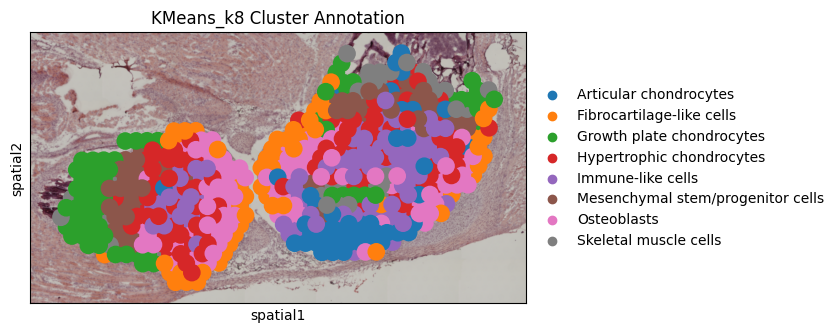

In [56]:
import scanpy as sc
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# --------------------------------------------------
# Step 1: Run k-means clustering with k = 8
# --------------------------------------------------
pca_mat = adata.obsm["X_pca"]
kmeans = KMeans(n_clusters=8, random_state=123)
adata.obs["kmeans_k8"] = kmeans.fit_predict(pca_mat).astype(str)

# --------------------------------------------------
# Step 2: Assign expert/GPT-based cell types per cluster
# --------------------------------------------------
cluster_labels = {
    "0": "Articular chondrocytes",
    "1": "Skeletal muscle cells",
    "2": "Mesenchymal stem/progenitor cells",
    "3": "Osteoblasts",
    "4": "Hypertrophic chondrocytes",
    "5": "Immune-like cells",
    "6": "Fibrocartilage-like cells",
    "7": "Growth plate chondrocytes"
}
adata.obs["celltype_k8"] = adata.obs["kmeans_k8"].map(cluster_labels)

# --------------------------------------------------
# Step 3: Visualize spatial annotation with enhanced formatting
# --------------------------------------------------
sc.pl.spatial(
    adata,
    color="celltype_k8",
    img_key="hires",
    size=2.5,
    title="KMeans_k8 Cluster Annotation",
    legend_loc="right margin",
    show=True
)


### 🔬 Manual Cell Type Annotation with k-means (k = 8)

This section demonstrates how we apply domain knowledge (or GPTCelltype-derived annotation) to interpret unsupervised clusters derived from k-means clustering (`k = 8`).

- **Step 1**: Perform k-means clustering on the PCA-reduced gene expression data.
- **Step 2**: Assign meaningful biological cell type labels to each cluster based on marker gene evidence, spatial context, or GPT-based interpretation.
- **Step 3**: Visualize the annotated spatial map using `scanpy`.

The annotated spatial plot offers intuitive insights into the tissue structure and validates the unsupervised clustering results against known biology.


C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\1004858858.py:15: FutureWarning: Use `squidpy.read.visium` instead.
  adata = sc.read_visium(visium_path)
C:\Users\abuhu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
C:\Users\abuhu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\1004858858.py:47: ImplicitModificationWarning: Setting element `.obsm['spatial']` of view, initializing view as actual.
  adata.obsm["spatial"] = adata.obsm["spatial"].astype("float") * hi

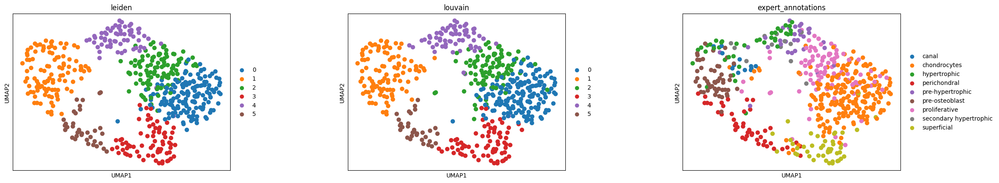

C:\Users\abuhu\AppData\Local\Temp\ipykernel_31904\1004858858.py:84: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


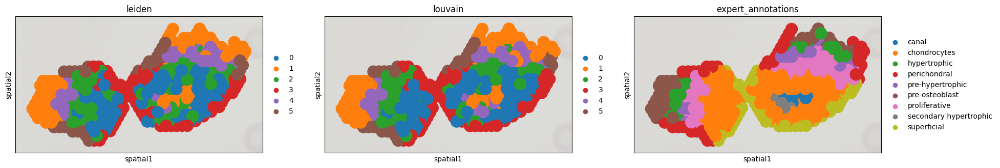

In [57]:
# Squidpy-based Spatial Transcriptomics Clustering Tutorial (Leiden + Louvain)
# Author: Based on data and instructions from supervisor

import scanpy as sc
import squidpy as sq
import pandas as pd
from squidpy.im import ImageContainer
import matplotlib.pyplot as plt
import json

# -----------------------------------------------
# Step 1: Load Visium spatial transcriptomics data
# -----------------------------------------------
visium_path = "C:/Users/abuhu/cellpie/cellpie/knee_spatial_python/knee"
adata = sc.read_visium(visium_path)
adata.var_names_make_unique()

# -----------------------------------------------
# Step 2: Add expert annotations to adata.obs
# -----------------------------------------------
annotations_path = f"{visium_path}/GP_features_1_Slide_1_A_WTM_Results_GP_ann.csv"
annotations = pd.read_csv(annotations_path)
annotations = annotations[annotations['GP'].notna() & (annotations['GP'] != "")]
annotations = annotations.set_index("Barcode")

common_barcodes = adata.obs_names.intersection(annotations.index)
adata = adata[common_barcodes].copy()
adata.obs["expert_annotations"] = annotations.loc[common_barcodes, "GP"]

# -----------------------------------------------
# Step 3: Preprocess gene expression matrix
# -----------------------------------------------
sc.pp.calculate_qc_metrics(adata, inplace=True)
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)
adata = adata[:, adata.var.highly_variable]

# -----------------------------------------------
# Step 4: Load histology image using Squidpy
# -----------------------------------------------
image_path = f"{visium_path}/spatial/tissue_hires_image.png"
scalefactor_path = f"{visium_path}/spatial/scalefactors_json.json"
with open(scalefactor_path, "r") as f:
    scalefactors = json.load(f)
hires_scale = scalefactors["tissue_hires_scalef"]
adata.obsm["spatial"] = adata.obsm["spatial"].astype("float") * hires_scale

img = ImageContainer(image_path, layer="image")
library_id = list(adata.uns["spatial"].keys())[0]

# -----------------------------------------------
# Step 5: Extract image features
# -----------------------------------------------
sq.im.calculate_image_features(
    adata,
    img,
    features=["summary", "texture", "histogram"],
    key_added="image_features",
    library_id=library_id,
    n_jobs=1
)

# -----------------------------------------------
# Step 6: Dimensionality reduction and clustering (Leiden + Louvain)
# -----------------------------------------------
sc.pp.pca(adata)
sc.pp.neighbors(adata, use_rep="X_pca")
sc.tl.umap(adata)

# Run both clustering methods
sc.tl.leiden(adata, key_added="leiden")
sc.tl.louvain(adata, key_added="louvain")

# -----------------------------------------------
# Step 7: Visualize both clusterings + annotations
# -----------------------------------------------
sc.pl.umap(
    adata,
    color=["leiden", "louvain", "expert_annotations"],
    wspace=0.4
)

sc.pl.spatial(
    adata,
    color=["leiden", "louvain", "expert_annotations"],
    spot_size=50,
    img_key="hires",
    library_id=library_id,
    crop_coord=None,
    alpha_img=0.6,
    ncols=3
)

# -----------------------------------------------
# Step 8: Save processed AnnData object
# -----------------------------------------------
adata.write("adata_squidpy_processed_with_louvain.h5ad")


### Using ARI across two clustering technique with respect to expert annotation.

ARI between Leiden and Expert Annotations: 0.3748
ARI between Louvain and Expert Annotations: 0.4180


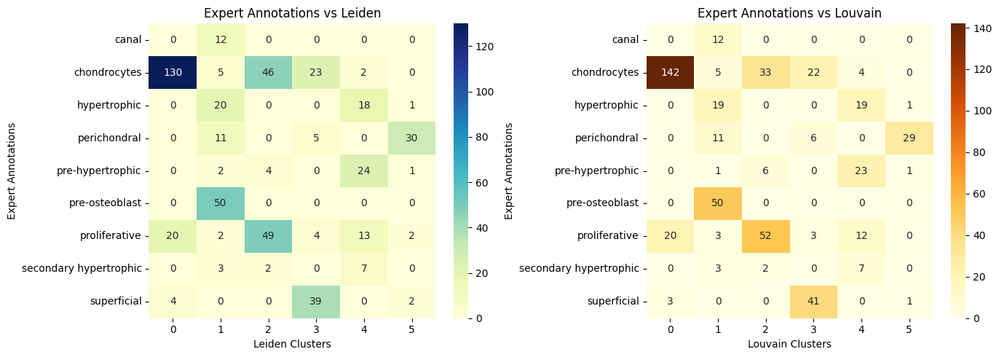

In [58]:
# -----------------------------------------------
# Step X: Compare Clustering with Expert Annotations using ARI
# -----------------------------------------------

from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Convert all labels to string to ensure compatibility
leiden_labels = adata.obs["leiden"].astype(str)
louvain_labels = adata.obs["louvain"].astype(str)
expert_labels = adata.obs["expert_annotations"].astype(str)

# Compute ARI
ari_leiden_expert = adjusted_rand_score(leiden_labels, expert_labels)
ari_louvain_expert = adjusted_rand_score(louvain_labels, expert_labels)

print(f"ARI between Leiden and Expert Annotations: {ari_leiden_expert:.4f}")
print(f"ARI between Louvain and Expert Annotations: {ari_louvain_expert:.4f}")

# Optional: Confusion matrix heatmaps
fig, axs = plt.subplots(1, 2, figsize=(14, 5))

# Leiden vs Expert
conf1 = pd.crosstab(expert_labels, leiden_labels)
sns.heatmap(conf1, annot=True, fmt="d", cmap="YlGnBu", ax=axs[0])
axs[0].set_title("Expert Annotations vs Leiden")
axs[0].set_xlabel("Leiden Clusters")
axs[0].set_ylabel("Expert Annotations")

# Louvain vs Expert
conf2 = pd.crosstab(expert_labels, louvain_labels)
sns.heatmap(conf2, annot=True, fmt="d", cmap="YlOrBr", ax=axs[1])
axs[1].set_title("Expert Annotations vs Louvain")
axs[1].set_xlabel("Louvain Clusters")
axs[1].set_ylabel("Expert Annotations")

plt.tight_layout()
plt.show()


### Hugging Face ViT
### Install Hugging Face Transformers

In [59]:
# pip install transformers timm ### in power shell

### Hugging face tool: Image extraction features.
Define a Function to Extract Image Features per Spot

In [60]:
from PIL import Image
import numpy as np
import pandas as pd
from tqdm import tqdm
import torch
from transformers import AutoImageProcessor, AutoModel


### Set up your model and image

In [61]:
# Load the tissue image
tissue_img = Image.open("C:/Users/abuhu/cellpie/cellpie/knee_spatial_python/knee/spatial/tissue_hires_image.png").convert("RGB")

# Load ViT model and processor
processor = AutoImageProcessor.from_pretrained("google/vit-base-patch16-224")
model = AutoModel.from_pretrained("google/vit-base-patch16-224")
model.eval()


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


ViTModel(
  (embeddings): ViTEmbeddings(
    (patch_embeddings): ViTPatchEmbeddings(
      (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (dropout): Dropout(p=0.0, inplace=False)
  )
  (encoder): ViTEncoder(
    (layer): ModuleList(
      (0-11): 12 x ViTLayer(
        (attention): ViTAttention(
          (attention): ViTSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
          )
          (output): ViTSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.0, inplace=False)
          )
        )
        (intermediate): ViTIntermediate(
          (dense): Linear(in_features=768, out_features=3072, bias=True)
          (intermediate_act_fn): GELUActivation()
        )
        (output): ViTOutput(
          (d

### Crop and extract features

### Apply to All Spots

In [62]:
spot_features = []
spot_names = []

# Use scale factor from scalefactors_json
scale_factor = 0.1446027  # or extract it from JSON dynamically

# Size of crop box around each spot
crop_radius = 32  # pixels, adjust as needed

for i, spot_id in enumerate(tqdm(adata.obs_names)):
    x, y = adata.obsm["spatial"][i]
    # Scale coordinates to match image resolution
    x_img = int(x * scale_factor)
    y_img = int(y * scale_factor)

    # Define bounding box (left, upper, right, lower)
    box = (
        x_img - crop_radius,
        y_img - crop_radius,
        x_img + crop_radius,
        y_img + crop_radius,
    )

    # Crop from H&E image
    cropped_img = tissue_img.crop(box)

    # Extract features
    inputs = processor(images=cropped_img, return_tensors="pt")
    with torch.no_grad():
        outputs = model(**inputs)
    pooled_features = outputs.pooler_output[0].numpy()

    spot_features.append(pooled_features)
    spot_names.append(spot_id)

# Save features into AnnData
hf_df = pd.DataFrame(spot_features, index=spot_names)
adata.obsm["hf_features"] = hf_df


100%|██████████| 531/531 [02:45<00:00,  3.20it/s]


### Use These Features in cellpie

In [63]:
adata.obsm["features"] = adata.obsm["hf_features"]


### Now let's proceed with CellPie:

###  STEP 1: Extract Image Features with CellPie

CellPie's histogram-based image feature extractor

In [64]:
from feature_extr import extract_features

# Path to the H&E image and spot scale
img_path = "C:/Users/abuhu/cellpie/cellpie/knee_spatial_python/knee/spatial/tissue_hires_image.png"

# Choose scales and number of bins (adjust if needed)
spot_scale = [1.0]
bins = 10

# Extract image features and attach them to adata
features_df = extract_features(adata, img_path, spot_scale=spot_scale, bins=bins)


C:\Users\abuhu\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\anndata\utils.py:434: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


###  STEP 2: Preprocess with CellPie Utilities

This step normalizes gene expression and image features.

In [65]:
from cp_utils import preprocess_data_visium

adata = preprocess_data_visium(adata)


### STEP 3: Run CellPie’s Joint intNMF

Use CellPie's intNMF class to jointly decompose gene + image features.

In [66]:
from cellpie_main import intNMF

# Define model
model = intNMF(adata, n_topics=6, random_state=42, epochs=30, mod1_skew=1, init='random')

# Fit model
model.fit(adata)


Fitting CellPie ...
Adding factor values to adata.obs ...


### This will:

Produce latent topics (Factor_1, ..., Factor_k)

Attach them to adata.obs

Store expression/image loadings in model.phi_expr and model.phi_im

### STEP 4: Visualize CellPie Topics
Use built-in plotting to view factor (topic) spatial distribution.

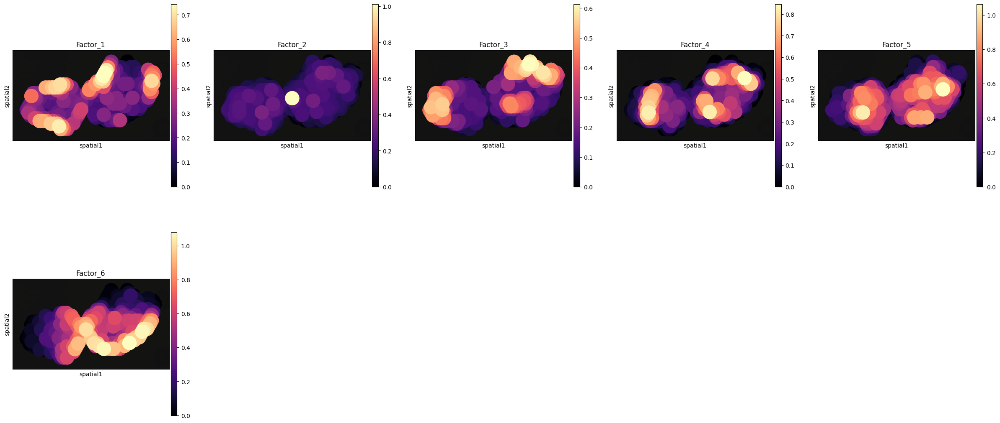

In [67]:
from cp_utils import plot_topic_proportions

plot_topic_proportions(adata, topics=6)


### STEP 5: Compare to Squidpy Clustering 
Overlay both leiden (from Squidpy) and Factor_X (from CellPie) in adata.obs, and compare:

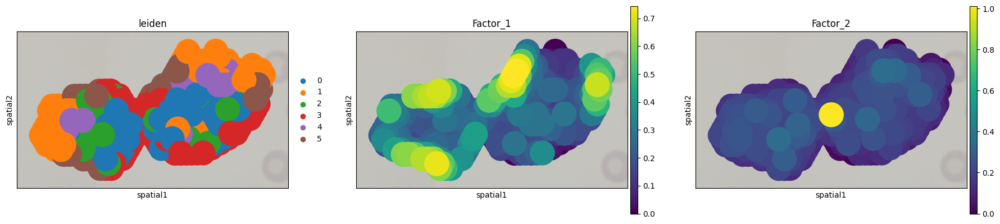

In [68]:
sc.pl.spatial(adata, color=["leiden", "Factor_1", "Factor_2"], ncols=3)


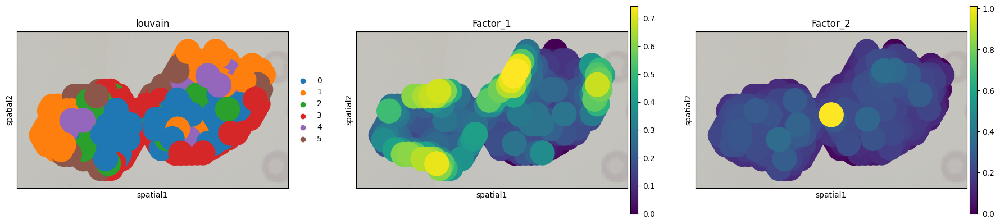

In [69]:
sc.pl.spatial(adata, color=["louvain", "Factor_1", "Factor_2"], ncols=3)

compute correlations with respect to both clustering method

In [70]:
adata.obs[["leiden", "Factor_1", "Factor_2"]].corr()


,leiden,Factor_1,Factor_2
leiden,1.000000,0.433415,-0.052617
Factor_1,0.433415,1.000000,-0.115553
Factor_2,-0.052617,-0.115553,1.000000


In [71]:
adata.obs[["louvain", "Factor_1", "Factor_2"]].corr()


,louvain,Factor_1,Factor_2
louvain,1.000000,0.420653,-0.060109
Factor_1,0.420653,1.000000,-0.115553
Factor_2,-0.060109,-0.115553,1.000000


### Louvain Clustering — Add Side-by-Side with Leiden

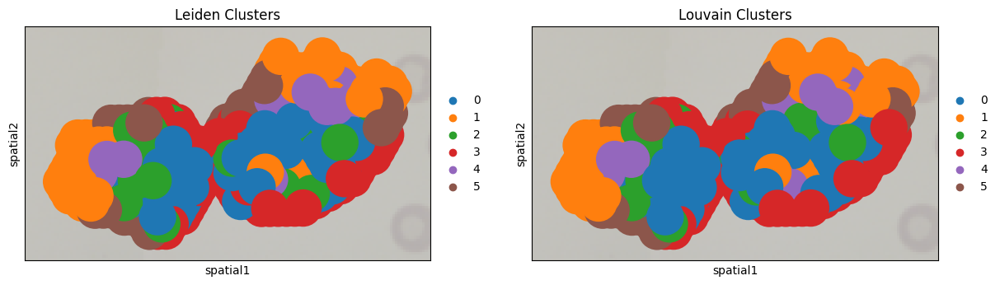

In [72]:
# Run Louvain clustering
sc.tl.louvain(adata, key_added="louvain")

# Plot both Leiden and Louvain clustering results side by side
sc.pl.spatial(adata, color=["leiden", "louvain"], ncols=2, title=["Leiden Clusters", "Louvain Clusters"])


### Run cellpie Analysis (intNMF)

In [73]:
from cellpie_main import intNMF

# Parameters
n_topics = 6  # or another number based on model selection
model = intNMF(adata, n_topics=n_topics, init='random', epochs=20, mod1_skew=1)

# Fit model
model.fit(adata)

# The factors are now in adata.obs["Factor_1"], ..., ["Factor_k"]


Fitting CellPie ...
Adding factor values to adata.obs ...


### Visualize Cellpie Topics vs. Clustering

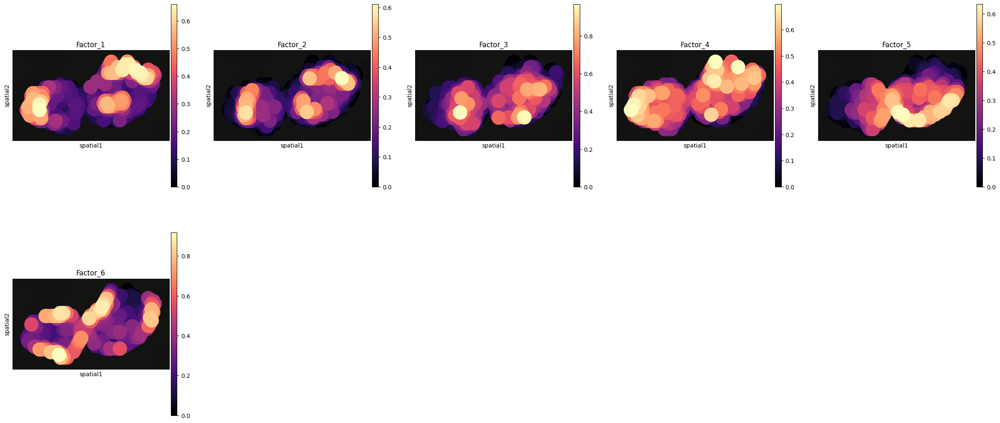

In [74]:
# Plot first 6 factors/topics learned by cellpie
from cellpie_main import plot_topic_proportions
plot_topic_proportions(adata, topics=n_topics)


### Compare Methods — Side-by-Side Visuals

In [75]:
import pandas as pd

# Load annotations
annotations = pd.read_csv("C:/Users/abuhu/cellpie/cellpie/knee_spatial_python/knee/GP_features_1_Slide_1_A_WTM_Results_GP_ann.csv")

# Standardize labels
annotations["GP"] = annotations["GP"].replace({
    "chondrocytes": "chondrocyte",
    "pre-osteo": "pre-osteoblast",
    "pre-osteoblasr": "pre-osteoblast",
    "secondary hypertophic": "secondary hypertrophic"
})

# Set barcode as index to align with adata.obs
annotations = annotations.set_index("Barcode")

# Join with adata.obs safely
adata.obs = adata.obs.join(annotations[["GP"]])
adata.obs.rename(columns={"GP": "Expert_Annotation"}, inplace=True)

# Check success
print("Expert_Annotation" in adata.obs.columns)  # Should return True


True


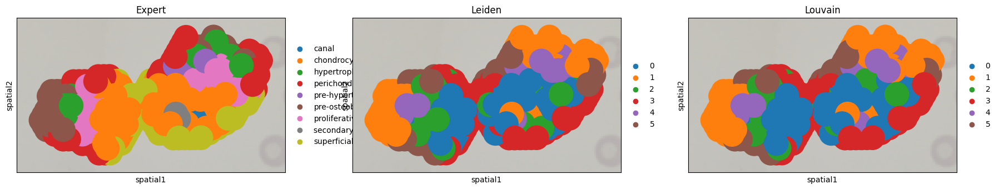

In [76]:
sc.pl.spatial(adata, color=["Expert_Annotation", "leiden", "louvain"], ncols=3, title=["Expert", "Leiden", "Louvain"])


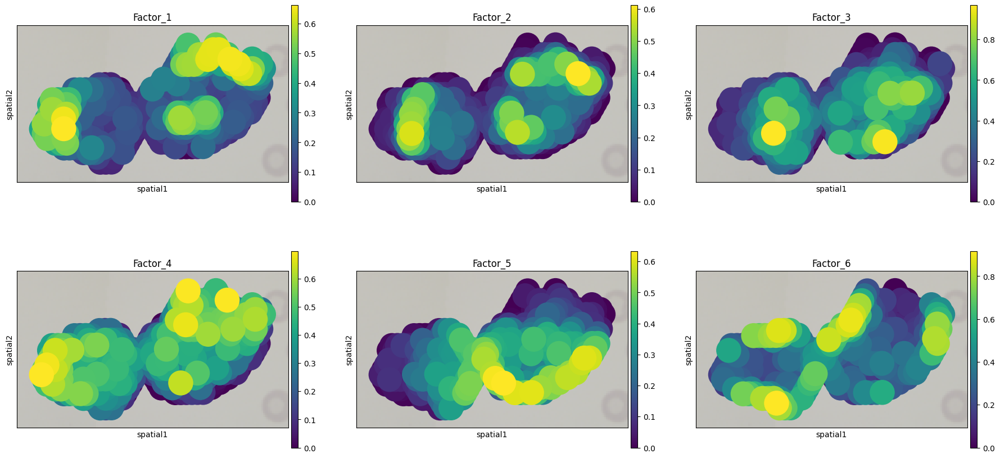

In [77]:
# Add Factor_1 through Factor_6
factors = [f"Factor_{i+1}" for i in range(n_topics)]
sc.pl.spatial(adata, color=factors, ncols=3, title=factors)


### ARI Comparison

In [78]:
from sklearn.metrics import adjusted_rand_score
import pandas as pd

# Prepare results dictionary
ari_scores = {}

# Ground truth
true_labels = adata.obs["Expert_Annotation"]

# 1. ARI for Leiden
if "leiden" in adata.obs.columns:
    ari_scores["Leiden vs Expert"] = adjusted_rand_score(true_labels, adata.obs["leiden"])

# 2. ARI for Louvain
if "louvain" in adata.obs.columns:
    ari_scores["Louvain vs Expert"] = adjusted_rand_score(true_labels, adata.obs["louvain"])

# 3. ARI for best-matching Cellpie Factor
# We'll convert continuous factors to hard labels using argmax across topics
import numpy as np

factor_cols = [col for col in adata.obs.columns if col.startswith("Factor_")]
if factor_cols:
    topic_matrix = adata.obs[factor_cols].to_numpy()
    hard_labels = np.argmax(topic_matrix, axis=1)
    ari_scores["Cellpie (intNMF) vs Expert"] = adjusted_rand_score(true_labels, hard_labels)

# Display results
ari_df = pd.DataFrame.from_dict(ari_scores, orient='index', columns=["Adjusted Rand Index"])
display(ari_df)


,Adjusted Rand Index
Leiden vs Expert,0.374814
Louvain vs Expert,0.417972
Cellpie (intNMF) vs Expert,0.205806


### ✅ 1. Calculate ARI and NMI
(for Leiden, Louvain, and Cellpie)

### ✅ 2. Plot a bar chart comparing both metrics
Paste this directly into your notebook after you've run clustering and cellpie.

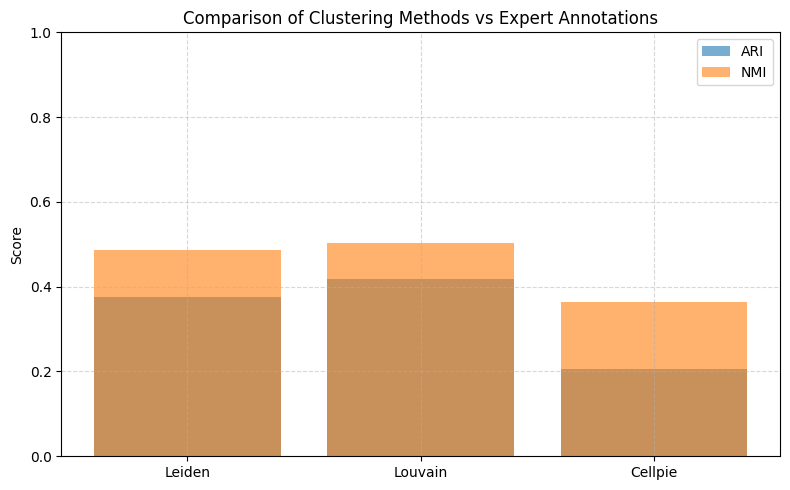

Metric,ARI,NMI
Method,,
Cellpie,0.206,0.364
Leiden,0.375,0.486
Louvain,0.418,0.504


In [79]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Prepare ground truth labels
true_labels = adata.obs["Expert_Annotation"]

# Initialize results list
results = []

# Helper to add scores
def add_scores(method_name, predicted_labels):
    ari = adjusted_rand_score(true_labels, predicted_labels)
    nmi = normalized_mutual_info_score(true_labels, predicted_labels)
    results.append({"Method": method_name, "Metric": "ARI", "Score": ari})
    results.append({"Method": method_name, "Metric": "NMI", "Score": nmi})

# Leiden
if "leiden" in adata.obs.columns:
    add_scores("Leiden", adata.obs["leiden"])

# Louvain
if "louvain" in adata.obs.columns:
    add_scores("Louvain", adata.obs["louvain"])

# Cellpie (use argmax across topic factors)
factor_cols = [col for col in adata.obs.columns if col.startswith("Factor_")]
if factor_cols:
    topic_matrix = adata.obs[factor_cols].to_numpy()
    hard_labels = np.argmax(topic_matrix, axis=1)
    add_scores("Cellpie", hard_labels)

# Convert to DataFrame
scores_df = pd.DataFrame(results)

# 📊 Bar Plot
plt.figure(figsize=(8, 5))
for metric in ["ARI", "NMI"]:
    subset = scores_df[scores_df["Metric"] == metric]
    plt.bar(subset["Method"], subset["Score"], alpha=0.6, label=metric)

plt.ylabel("Score")
plt.title("Comparison of Clustering Methods vs Expert Annotations")
plt.ylim(0, 1)
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

# Show numeric table too
display(scores_df.pivot(index="Method", columns="Metric", values="Score").round(3))


In [80]:
# Assign Hugging Face ViT features for use in cellpie
adata.obsm["features"] = adata.obsm["hf_features"]

In [81]:
from cellpie_main import intNMF

# Run intNMF using gene expression + ViT image features
n_topics = 6  # or another number based on model selection
model = intNMF(adata, n_topics=n_topics, init='random', epochs=20, mod1_skew=1)
model.fit(adata)

Fitting CellPie ...
Adding factor values to adata.obs ...


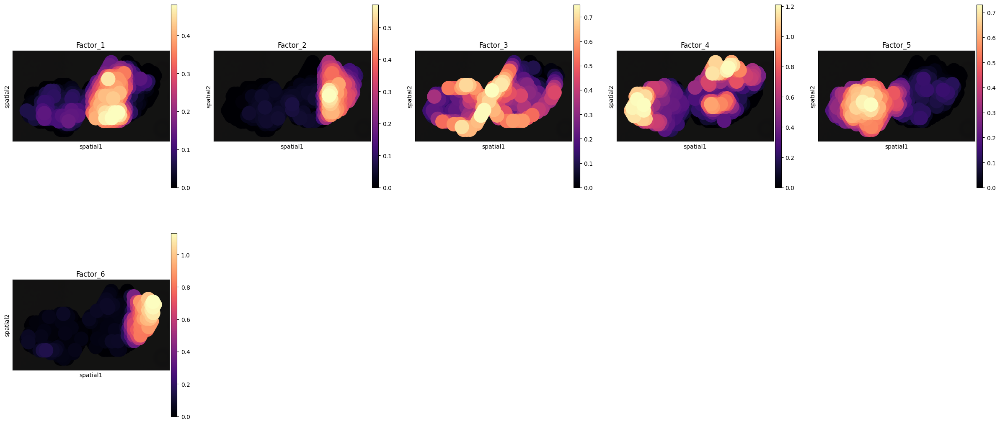

In [83]:
from cellpie_main import plot_topic_proportions
import matplotlib.pyplot as plt

# Plot spatial topic maps
plot_topic_proportions(adata, topics=n_topics)

# Save individual topic plots
for i in range(n_topics):
    sc.pl.spatial(
        adata, 
        color=f"Factor_{i+1}", 
        size=1.2, 
        show=False, 
        title=f"Cellpie Factor {i+1}"
    )
    plt.gcf().savefig(f"C:/Users/abuhu/cellpie/cellpie/results_Python/figures/Factor_{i+1}.png", dpi=300)
    plt.close()


In [84]:
# Save ARI/NMI scores if available
try:
    ari_df.to_csv("C:/Users/abuhu/cellpie/cellpie/results_Python/figures/ari_nmi_scores.csv")
except:
    print("ARI/NMI scores not available or not computed yet.")

In [85]:
# Assign Hugging Face ViT features for use in cellpie
adata.obsm["features"] = adata.obsm["hf_features"]

In [86]:
from cellpie_main import intNMF

# Run intNMF using gene expression + ViT image features
n_topics = 6  # or another number based on model selection
model = intNMF(adata, n_topics=n_topics, init='random', epochs=20, mod1_skew=1)
model.fit(adata)

Fitting CellPie ...
Adding factor values to adata.obs ...


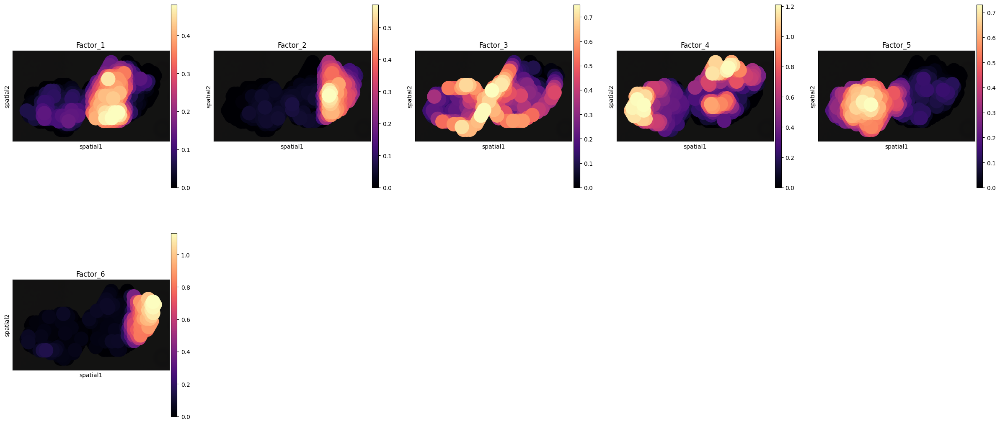

In [88]:
from cellpie_main import plot_topic_proportions
import matplotlib.pyplot as plt

# Plot spatial topic maps
plot_topic_proportions(adata, topics=n_topics)

# Save individual topic plots
for i in range(n_topics):
    sc.pl.spatial(
        adata, 
        color=f"Factor_{i+1}", 
        size=1.2, 
        show=False, 
        title=f"Cellpie Factor {i+1}"
    )
    plt.gcf().savefig(f"C:/Users/abuhu/cellpie/cellpie/results_Python/figures/Factor_{i+1}.png", dpi=300)
    plt.close()


In [89]:
# Save ARI/NMI scores if available
try:
    ari_df.to_csv("C:/Users/abuhu/cellpie/cellpie/results_Python/figures/ari_nmi_scores.csv")
except:
    print("ARI/NMI scores not available or not computed yet.")

In [90]:
# Assign Hugging Face ViT features for use in cellpie
adata.obsm["features"] = adata.obsm["hf_features"]

In [91]:
from cellpie_main import intNMF

# Run intNMF using gene expression + ViT image features
n_topics = 6  # or another number based on model selection
model = intNMF(adata, n_topics=n_topics, init='random', epochs=20, mod1_skew=1)
model.fit(adata)

Fitting CellPie ...
Adding factor values to adata.obs ...


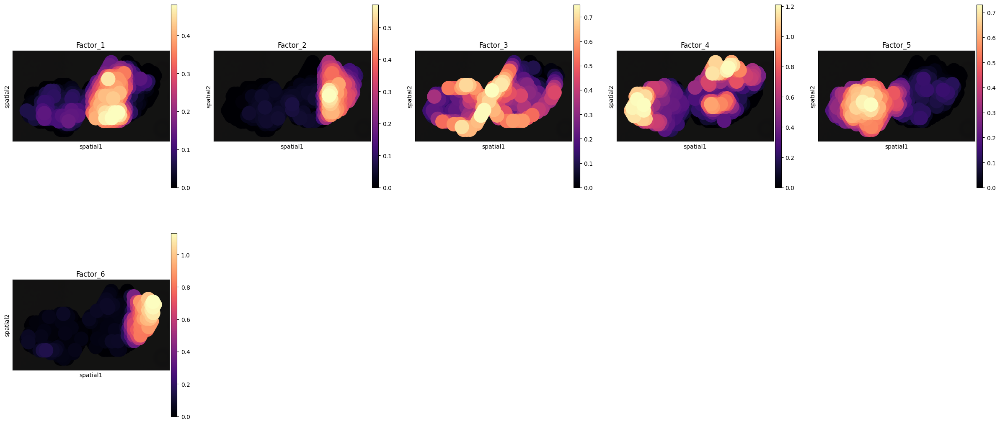

In [93]:
from cellpie_main import plot_topic_proportions
import matplotlib.pyplot as plt

# Plot spatial topic maps
plot_topic_proportions(adata, topics=n_topics)

# Save individual topic plots
for i in range(n_topics):
    fig = sc.pl.spatial(
        adata, 
        color=f"Factor_{i+1}", 
        size=1.2, 
        show=False, 
        title=f"Cellpie Factor {i+1}"
    )
    
    plt.gcf().savefig(f"C:/Users/abuhu/cellpie/cellpie/results_Python/figures/Factor_{i+1}.png", dpi=300)
    plt.close()


In [94]:
# Save ARI/NMI scores if available
try:
    ari_df.to_csv("C:/Users/abuhu/cellpie/cellpie/results_Python/figures/ari_nmi_scores.csv")
except:
    print("ARI/NMI scores not available or not computed yet.")